In [1]:
import pandas as pd

gamebyGame = pd.read_csv("~/Downloads/gameByGame.csv")
playerSeason = pd.read_csv("~/Downloads/playerSeason.csv")
playByPlay = pd.read_csv("~/Downloads/playByPlayData.csv")
weeklyRosterData = pd.read_csv("~/Downloads/weeklyRosterData.csv")
nextGenReceivingStats = pd.read_csv("~/Downloads/nextGenReceivingStats.csv")
nextGenPassingStats = pd.read_csv("~/Downloads/nextGenPassingStats.csv")
nextGenRushingStats = pd.read_csv("~/Downloads/nextGenRushingStats.csv")
ftnData = pd.read_csv("~/Downloads/ftnData.csv")
teamScores = pd.read_csv("~/Downloads/nfl2024SeasonOutcome.csv") # manually created

/var/folders/zz/3b4b_cj17rgb4t357254xqqc0000gp/T/ipykernel_92891/342254809.py:5: DtypeWarning: Columns (179,180,182,183,189,190,197,198,203,204,205,206,213,214,218,219,220,222,224,226,233,234,235,236,237,238,248,249,253,254,255,260,262,263,283,284) have mixed types. Specify dtype option on import or set low_memory=False.
  playByPlay = pd.read_csv("~/Downloads/playByPlayData.csv")


In [2]:
gamebyGame.head()

,player_id,player_name,player_display_name,position,position_group,headshot_url,recent_team,season,week,season_type,...,receiving_first_downs,receiving_epa,receiving_2pt_conversions,racr,target_share,air_yards_share,wopr,special_teams_tds,fantasy_points,fantasy_points_ppr
0,00-0023459,A.Rodgers,Aaron Rodgers,QB,QB,https://static.www.nfl.com/image/upload/f_auto...,NYJ,2024,1,REG,...,0.0,NaN,0,NaN,NaN,NaN,NaN,0.0,8.58,8.58
1,00-0023459,A.Rodgers,Aaron Rodgers,QB,QB,https://static.www.nfl.com/image/upload/f_auto...,NYJ,2024,2,REG,...,0.0,NaN,0,NaN,NaN,NaN,NaN,0.0,15.14,15.14
2,00-0023459,A.Rodgers,Aaron Rodgers,QB,QB,https://static.www.nfl.com/image/upload/f_auto...,NYJ,2024,3,REG,...,0.0,NaN,0,NaN,NaN,NaN,NaN,0.0,21.04,21.04
3,00-0023459,A.Rodgers,Aaron Rodgers,QB,QB,https://static.www.nfl.com/image/upload/f_auto...,NYJ,2024,4,REG,...,0.0,NaN,0,NaN,NaN,NaN,NaN,0.0,11.60,11.60
4,00-0023459,A.Rodgers,Aaron Rodgers,QB,QB,https://static.www.nfl.com/image/upload/f_auto...,NYJ,2024,5,REG,...,0.0,NaN,0,NaN,NaN,NaN,NaN,0.0,11.76,11.76


In [3]:
gamebyGame.shape

(5597, 53)

In [4]:
gamebyGame.columns

Index(['player_id', 'player_name', 'player_display_name', 'position',
       'position_group', 'headshot_url', 'recent_team', 'season', 'week',
       'season_type', 'opponent_team', 'completions', 'attempts',
       'passing_yards', 'passing_tds', 'interceptions', 'sacks', 'sack_yards',
       'sack_fumbles', 'sack_fumbles_lost', 'passing_air_yards',
       'passing_yards_after_catch', 'passing_first_downs', 'passing_epa',
       'passing_2pt_conversions', 'pacr', 'dakota', 'carries', 'rushing_yards',
       'rushing_tds', 'rushing_fumbles', 'rushing_fumbles_lost',
       'rushing_first_downs', 'rushing_epa', 'rushing_2pt_conversions',
       'receptions', 'targets', 'receiving_yards', 'receiving_tds',
       'receiving_fumbles', 'receiving_fumbles_lost', 'receiving_air_yards',
       'receiving_yards_after_catch', 'receiving_first_downs', 'receiving_epa',
       'receiving_2pt_conversions', 'racr', 'target_share', 'air_yards_share',
       'wopr', 'special_teams_tds', 'fantasy_points

In [5]:
columns_to_drop = [
    "player_id",  # Maybe drop this
    "player_name",  # Already have player_display_name
    "recent_team", #Team is not necessarily important
    "opponent_team", # Opponenet team is not necessarily important
    "position_group",  # Already have position
    "headshot_url",
    "season",  # All values are 2024
    "season_type",  # All values are REG
    "dakota",  # Unknown
    "targets",  # Already have target_share
    "fantasy_points",
    "fantasy_points_ppr",
    "Team Name",  # Needs to be joined in SQL
    "team_abbr",  # Needs to be joined in SQL
    "week number"  # Needs to be joined in SQL (already have week)
]

df = gamebyGame.drop(columns=columns_to_drop, errors="ignore")
df.columns

Index(['player_display_name', 'position', 'week', 'completions', 'attempts',
       'passing_yards', 'passing_tds', 'interceptions', 'sacks', 'sack_yards',
       'sack_fumbles', 'sack_fumbles_lost', 'passing_air_yards',
       'passing_yards_after_catch', 'passing_first_downs', 'passing_epa',
       'passing_2pt_conversions', 'pacr', 'carries', 'rushing_yards',
       'rushing_tds', 'rushing_fumbles', 'rushing_fumbles_lost',
       'rushing_first_downs', 'rushing_epa', 'rushing_2pt_conversions',
       'receptions', 'receiving_yards', 'receiving_tds', 'receiving_fumbles',
       'receiving_fumbles_lost', 'receiving_air_yards',
       'receiving_yards_after_catch', 'receiving_first_downs', 'receiving_epa',
       'receiving_2pt_conversions', 'racr', 'target_share', 'air_yards_share',
       'wopr', 'special_teams_tds'],
      dtype='object')

In [6]:
df.shape

(5597, 41)

In [ ]:
dftypes = df.dtypes.reset_index()
dftypes.columns = ["Column", "Data Type"]
dftypes


,Column,Data Type
0,player_display_name,object
1,position,object
2,week,int64
3,completions,int64
4,attempts,int64
5,passing_yards,float64
6,passing_tds,int64
7,interceptions,float64
8,sacks,float64
9,sack_yards,float64


### Data Descriptions

0.	player_id	- object/text/categorical - number that identifies the player 
1.	player_name	- object/text/categorical - name of the player
2.	player_display_name	- object/text/categorical - name of the player
3.	position	- object/text/categorical - position of player
4.	position_group	- object/text/categorical - position of player
5.	headshot_url	- object/text/categorical - picture of player
6.	recent_team	- object/text/categorical - team the player is on
7.	season	- int64 - the year the games occured in (2024)
8.	week	- int64 - the number identifying what week the game was played 
9.	season_type	- object/text/categorical -  indicating if the game belongs to regular or post season (REG)
10.	opponent_team	- object/text/categorical - name/abbr of the team they are playing against
11.	completions	- int64 - the amount of successful catches made from the quarterback's pass without the ball touching the ground
12.	attempts - int64 - the amount of tries the quartback made to make a completion/throw
13.	passing_yards - float64 - the total number of yards gained by a quarterback's forward passes during a football game or season
14.	passing_tds	- int64 -  if the play resulted in a passing TD.
15.	interceptions - float64 - if the pass was intercepted.
16.	sacks - float64 - when the quarterback is tackled behind the line of scrimmage before throwing a forward pass
17.	sack_yards - float64 - how many yards gained by the sack
18.	sack_fumbles - int64 - amount of fumbles that occured by a sack
19.	sack_fumbles_lost - int64 - number of times the quarterback loses possession of the football after fumbling the ball from a sack

**important for individual player stats: QB**

20.	passing_air_yards - float64 - total distance traveled by passes targeting that player, whether they caught it or not. 
21.	passing_yards_after_catch - float64 - the total number of yards gained by a quarterback's pass that was caught by a player
22.	passing_first_downs	- float64 - the team advanced the ball at least ten yards during a pass
23.	passing_epa	- float64 - a measure of success which defines the value of each play by the effect it has on the offense's likelihood to score during a pass
24.	passing_2pt_conversions	- int64 - the team that just scored must run a play from scrimmage close to the opponent's goal line and advance the ball across the goal line in the same manner as if it were scoring a touchdown during a pass
25.	pacr - float64 - Passing Air Conversion Ratio - PACR = passing_yards / passing_air_yards.
26.	dakota - float64 - ?
27.	carries	- int64 - a single rushing play

**important for individual player stats: Offense**

28.	rushing_yards - float64 - the total number of yards gained by a player or team when advancing the ball on the ground during a football game.
29.	rushing_tds	- int64 - a play where the runner carries the ball into the end zone without a forward pass being involved
30.	rushing_fumbles	- float64 - fumble done by the offense
31.	rushing_fumbles_lost - float64 - the yards lost from the offensive player that fumbled
32.	rushing_first_downs - float64 - a first down completed by the offense
33.	rushing_epa	- float64 - measures how well a team performs compared to their expectation on a play-by-play basis by the offense
34.	rushing_2pt_conversions	- int64 - 2pt conversions done by the offense
35.	receptions	- int64 -  part of a passing play in which a player in bounds successfully catches (receives) a forward pass thrown from their team's quarterback behind the line of scrimmage
36.	targets	- int64 - passes thrown by a quarterback in the direction of a specific receiver or tight end

**important for individual player stats: Receiver**

37.	receiving_yards	- float64 - the number of yards gained by a receiver on a passing play 
38.	receiving_tds	- int64 - the number of yards gained by a receiver from a touchdown
39.	receiving_fumbles - float64 - a fumble the moment a player gets possession of the ball
40.	receiving_fumbles_lost	- float64 - the yards lost when a fumble occurs the moment a player gets possession of the ball
41.	receiving_air_yards	float64 -  measure of how many yards the football travels in the air, from the line of scrimmage the moment a player gets possession of the ball
42.	receiving_yards_after_catch - float64 -  measure of how many yards football travels after the ball is caught by the receiver
43.	receiving_first_downs	- float64 - a first down completed after the ball is caught by the receiver
44.	receiving_epa	- float64 - measures how well a team performs compared to their expectation on a play-by-play basis by the receiver
45.	receiving_2pt_conversions	- int64 - 2pt conversions done by the receiver
46.	racr	- float64 - receiver air conversion ratio (RACR) = receiving yards / air yards

**important for calculations: Percentages**

47.	target_share	- float64 - Target share is a term used in NFL football to describe the number of targets that a player receives during a game or over the course of a season. 
48.	air_yards_share	- float64 -  the percentage of a team's total Air Yards that are attributed to a specific player
49.	wopr	- float64 - calculated by combining a player’s air yards share and target share - WOPR = 1.5 * Target Share + 0.7 * Air Yards Share
50.	special_teams_tds - float64 - a touchdown from special teams, players on the field during kickoff plays
51.	fantasy_points	- float64 - based on the performance of their starting players' performances in NFL games
52.	fantasy_points_ppr	- float64 - points per perception - a way to earn points in your fantasy football league.

**Data from teamScores**

53.	Team Name	- object/text/categorical - name of the football team
54.	team_abbr	- object/text/categorical - abbrevaition of the football team
55.	week number	int64 - the number identifying what week the game was played 
56.	score	int64 - the final score at the end of the game
57.	outcome	object/num  - whether the team won or lost the game - W/L - can be changed to binary using encoding (W=1, L=0)

Text(0.5, 1.0, 'Heatmap of Missingness')

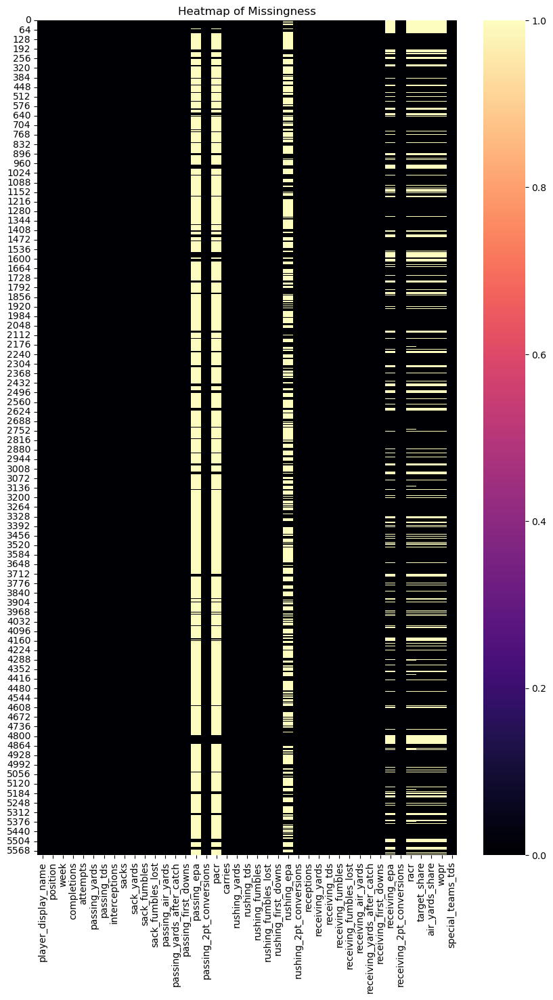

In [8]:
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np

plt.figure(figsize=(10,16))
sns.heatmap(df.isna(), cmap="magma")
plt.title("Heatmap of Missingness")

In [9]:
print(df.isnull().sum())

player_display_name               0
position                          0
week                              0
completions                       0
attempts                          0
passing_yards                     0
passing_tds                       0
interceptions                     0
sacks                             0
sack_yards                        0
sack_fumbles                      0
sack_fumbles_lost                 0
passing_air_yards                 0
passing_yards_after_catch         0
passing_first_downs               0
passing_epa                    4891
passing_2pt_conversions           0
pacr                           4902
carries                           0
rushing_yards                     0
rushing_tds                       0
rushing_fumbles                   0
rushing_fumbles_lost              0
rushing_first_downs               0
rushing_epa                    3239
rushing_2pt_conversions           0
receptions                        0
receiving_yards             

Missing values in passing_epa, pacr, and rushing epa
* passing_epa- float64 - a measure of success which defines the value of each play by the effect it has on the offense's likelihood to score during a pass
* pacr - float64 - Passing Air Conversion Ratio - PACR = passing_yards / passing_air_yards.
* rushing_epa	- float64 - measures how well a team performs compared to their expectation on a play-by-play basis by the offense

makes all these features is nan or null -> 0 

In [10]:
#Imputing
cols_to_impute = ['passing_epa', 'pacr', 'rushing_epa', 'air_yards_share', 'wopr']
df[cols_to_impute] = df[cols_to_impute].fillna(0)

#Count based features: TDs, completions, interceptions, sacks, carries, receptions, special_teams_tds 
#Continuous features: passing_yards, sack_yards, sack_fumbles, sack_fumbles_lost, passing_air_yards, passing_yards_after_catch, passing_tds, passing_first_downs, passing_epa, 
# passing_2pt_conversions, pacr, rushing_yards, rushing_tds, rushing_fumbles, rushing_fumbles_lost', rushing_first_downs, rushing_epa, rushing_2pt_conversions, 
# receiving_yards, receiving_tds, receiving_fumbles, receiving_fumbles_lost, receiving_air_yards, receiving_yards_after_catch, receiving_first_downs, receiving_epa, receiving_2pt_conversions
# racr, target_share, air_yards_share, wopr, 

In [11]:
#Encoding - categorical data = position

# Assuming df is your DataFrame
#position_encoded = pd.get_dummies(df['position'], prefix='pos')
#df = pd.concat([df, position_encoded], axis=1)
#df.drop('position', axis=1, inplace=True)
df

#Created new features depending on the players position, there is a 1 in the column if the player is that position or a 0 if the player is

,player_display_name,position,week,completions,attempts,passing_yards,passing_tds,interceptions,sacks,sack_yards,...,receiving_air_yards,receiving_yards_after_catch,receiving_first_downs,receiving_epa,receiving_2pt_conversions,racr,target_share,air_yards_share,wopr,special_teams_tds
0,Aaron Rodgers,QB,1,13,21,167.0,1,1.0,1.0,5.0,...,0.0,0.0,0.0,NaN,0,NaN,NaN,0.000000,0.000000,0.0
1,Aaron Rodgers,QB,2,18,30,176.0,2,0.0,2.0,12.0,...,0.0,0.0,0.0,NaN,0,NaN,NaN,0.000000,0.000000,0.0
2,Aaron Rodgers,QB,3,27,35,281.0,2,0.0,2.0,14.0,...,0.0,0.0,0.0,NaN,0,NaN,NaN,0.000000,0.000000,0.0
3,Aaron Rodgers,QB,4,24,42,225.0,0,0.0,5.0,41.0,...,0.0,0.0,0.0,NaN,0,NaN,NaN,0.000000,0.000000,0.0
4,Aaron Rodgers,QB,5,29,54,244.0,2,3.0,3.0,26.0,...,0.0,0.0,0.0,NaN,0,NaN,NaN,0.000000,0.000000,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5592,Trey Benson,RB,10,0,0,0.0,0,0.0,0.0,0.0,...,-8.0,33.0,2.0,1.987017,0,-3.125,0.083333,-0.072072,0.074550,0.0
5593,Trey Benson,RB,12,0,0,0.0,0,0.0,0.0,0.0,...,0.0,0.0,0.0,NaN,0,NaN,NaN,0.000000,0.000000,0.0
5594,Trey Benson,RB,13,0,0,0.0,0,0.0,0.0,0.0,...,0.0,0.0,0.0,NaN,0,NaN,NaN,0.000000,0.000000,0.0
5595,Trey Benson,RB,14,0,0,0.0,0,0.0,0.0,0.0,...,-5.0,9.0,0.0,-0.144496,0,-0.800,0.026316,-0.031847,0.017181,0.0


Text(0.5, 1.0, 'Correlation Heatmap')

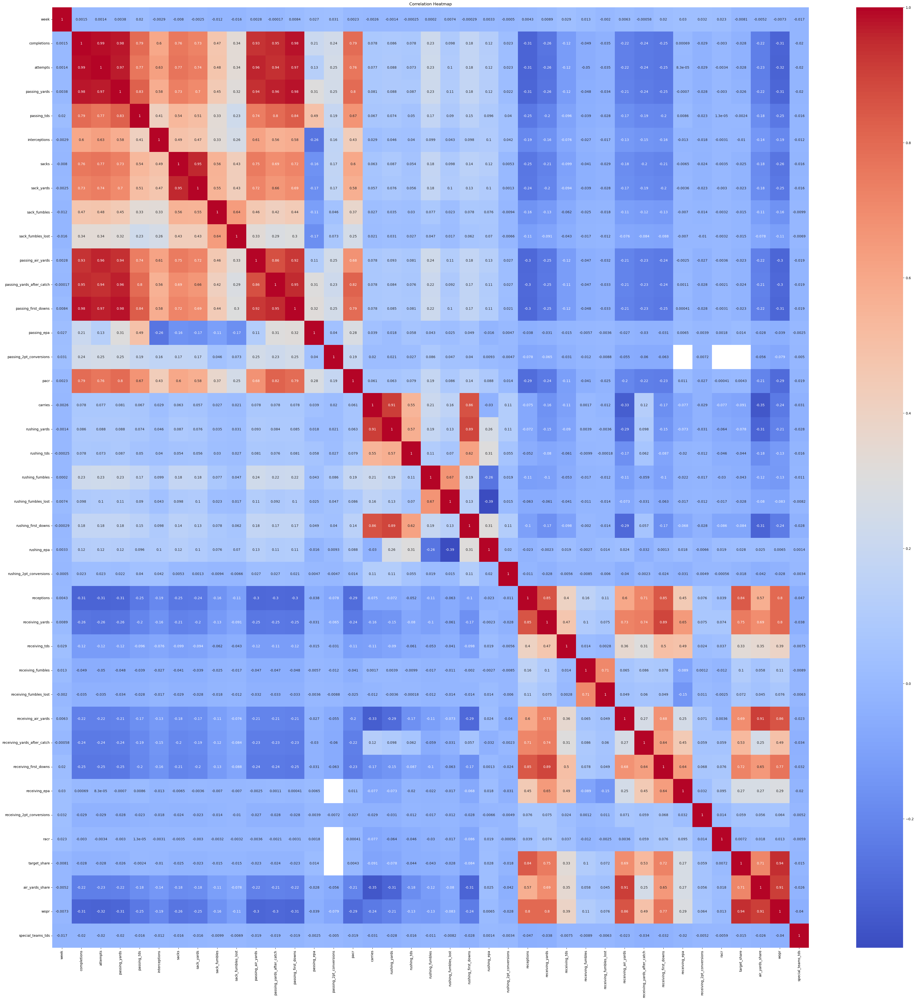

In [12]:
#Standardize formats
numeric_cols = df.select_dtypes(include=[np.number]).columns
corr_matrix = df[numeric_cols].corr()
plt.figure(figsize=(50, 50))
sns.heatmap(corr_matrix, annot=True, cmap='coolwarm')
plt.title('Correlation Heatmap')

In [13]:
df.columns

Index(['player_display_name', 'position', 'week', 'completions', 'attempts',
       'passing_yards', 'passing_tds', 'interceptions', 'sacks', 'sack_yards',
       'sack_fumbles', 'sack_fumbles_lost', 'passing_air_yards',
       'passing_yards_after_catch', 'passing_first_downs', 'passing_epa',
       'passing_2pt_conversions', 'pacr', 'carries', 'rushing_yards',
       'rushing_tds', 'rushing_fumbles', 'rushing_fumbles_lost',
       'rushing_first_downs', 'rushing_epa', 'rushing_2pt_conversions',
       'receptions', 'receiving_yards', 'receiving_tds', 'receiving_fumbles',
       'receiving_fumbles_lost', 'receiving_air_yards',
       'receiving_yards_after_catch', 'receiving_first_downs', 'receiving_epa',
       'receiving_2pt_conversions', 'racr', 'target_share', 'air_yards_share',
       'wopr', 'special_teams_tds'],
      dtype='object')

In [14]:
#Outlier detection - Identify potential outliers - Assess impact of outliers - Decide on treatment of outliers

from scipy import stats

def find_outliers_df(data):
    outlier_data = []  # List to store results
    
    for column in data.select_dtypes(include=[np.number]).columns:  # Loop through numerical columns
        z = np.abs(stats.zscore(data[column].dropna()))  # Calculate Z-score
        threshold = 3
        num_outliers = np.sum(z > threshold)  # Count outliers

        outlier_data.append({"Column": column, "Outliers Count": num_outliers})  # Append to list

    # Convert to DataFrame
    outlier_df = pd.DataFrame(outlier_data)
    
    return outlier_df  # Return the DataFrame

# Get outlier DataFrame and display it
outlier_df = find_outliers_df(df)
outlier_df

,Column,Outliers Count
0,week,0
1,completions,252
2,attempts,228
3,passing_yards,233
4,passing_tds,257
5,interceptions,98
6,sacks,235
7,sack_yards,175
8,sack_fumbles,167
9,sack_fumbles_lost,76



The average number of outliers across numerical columns is: 127.17948717948718


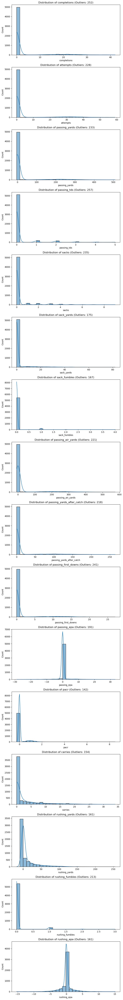

In [15]:
#If outliers if greater than 114, create a bar plot

# Function to plot only columns with more than 114 outliers
def plot_outliers(data, outlier_df, avg_outliers):
    columns_to_plot = outlier_df[outlier_df["Outliers Count"] > round(avg_outliers)]["Column"].tolist()

    if columns_to_plot:
        num_plots = len(columns_to_plot)
        fig, axes = plt.subplots(nrows=num_plots, figsize=(8, num_plots * 4))  # Dynamic sizing

        if num_plots == 1:
            axes = [axes]  # Ensure axes is iterable when there's only one plot

        for ax, col in zip(axes, columns_to_plot):
            sns.histplot(data[col], bins=30, kde=True, ax=ax)
            ax.set_title(f"Distribution of {col} (Outliers: {outlier_df[outlier_df['Column'] == col]['Outliers Count'].values[0]})")

        plt.tight_layout()
        plt.show()


# Calculate the average of the outlier counts
average_outliers = outlier_df['Outliers Count'].mean()
print(f"\nThe average number of outliers across numerical columns is: {average_outliers}")

plot_outliers(df, outlier_df, average_outliers)  # Generate subplots only for columns with > 114 outliers

EDA Visualizations - Scatterplots 

In [16]:
#Scatterplots of the strongest correlated features

import plotly.express as px

fig = px.scatter(df, x='rushing_yards', y='rushing_first_downs', color='carries')
#plt.title("Height vs. Weight Distribution Colored by General Health")
fig.update_layout(
    title="Relationship Between Rushing Yards and Rushing First Downs by Carries"
)
fig.show()

In [17]:
fig = px.scatter(df, x='receiving_yards', y='receiving_first_downs', color='receptions')
#plt.title("Height vs. Weight Distribution Colored by General Health")
fig.update_layout(
    title="Relationship Between Receiving Yards and Receiving First Downs by Receptions"
)
fig.show()

In [18]:
fig = px.scatter(df, x='target_share', y='air_yards_share', color='wopr')
#plt.title("Height vs. Weight Distribution Colored by General Health")
fig.update_layout(
    title="Relationship Between Target Share and Air Yards Share by WOPR"
)
fig.show()

<function matplotlib.pyplot.tight_layout(*, pad: 'float' = 1.08, h_pad: 'float | None' = None, w_pad: 'float | None' = None, rect: 'tuple[float, float, float, float] | None' = None) -> 'None'>

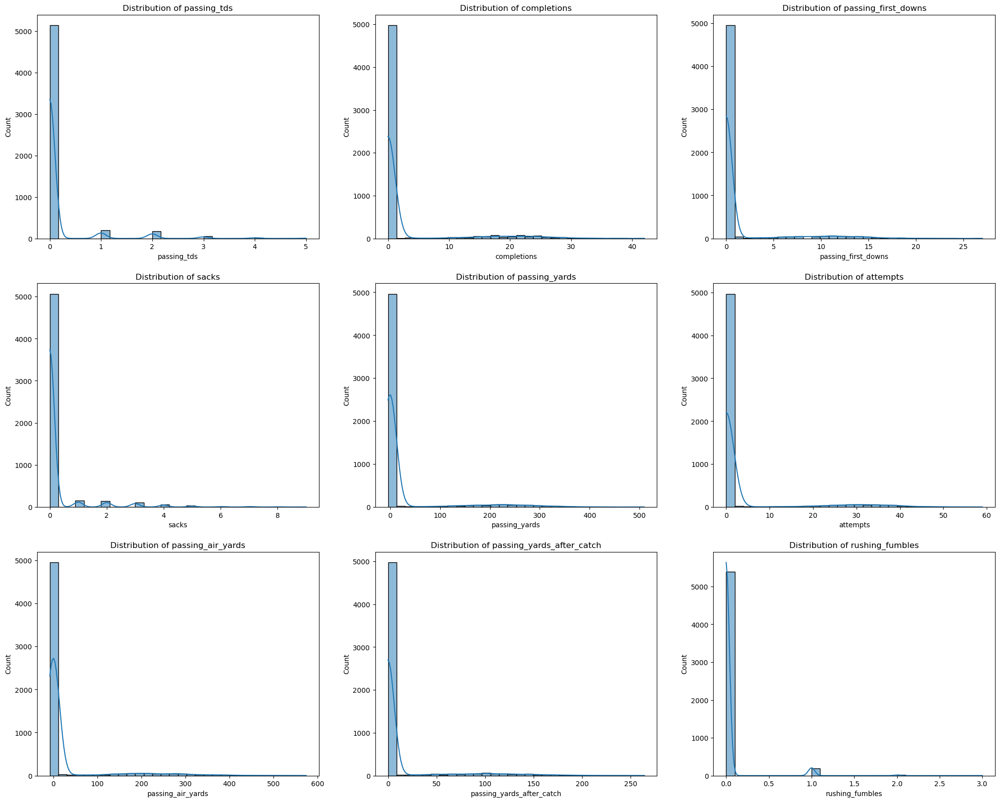

In [19]:
import matplotlib.pyplot as plt
import numpy as np
import seaborn as sns

outlier_features = ['passing_tds', 'completions', 'passing_first_downs', 'sacks', 'passing_yards', 'attempts', 'passing_air_yards', 'passing_yards_after_catch', 'rushing_fumbles']

plt.figure(figsize=(25, 20))
for i, col in enumerate(outlier_features, 1):
    plt.subplot(3, 3, i)
    sns.histplot(df[col], kde=True, bins=30)
    plt.title(f'Distribution of {col}')
plt.tight_layout


#### Separate dataset via player positions

In [20]:
#Split the Data by Position
# Create deep copies
qb_df = df[df['position'] == 'QB'].copy()
wr_df = df[df['position'] == 'WR'].copy()
rb_df = df[df['position'] == 'RB'].copy()
cb_df = df[df['position'] == 'CB'].copy()
de_df = df[df['position'] == 'DE'].copy()
fb_df = df[df['position'] == 'FB'].copy()
fs_df = df[df['position'] == 'FS'].copy()
g_df = df[df['position'] == 'G'].copy()
ilb_df = df[df['position'] == 'ILB'].copy()
mlb_df = df[df['position'] == 'MLB'].copy()
olb_df = df[df['position'] == 'OLB'].copy()
p_df = df[df['position'] == 'P'].copy()
ss_df = df[df['position'] == 'SS'].copy()
t_df = df[df['position'] == 'T'].copy()
te_df = df[df['position'] == 'TE'].copy()

In [21]:
%pip install yellowbrick

Note: you may need to restart the kernel to use updated packages.


___
### Clustering
____

____
## K MEANS

____
#### Quarterbacks
____

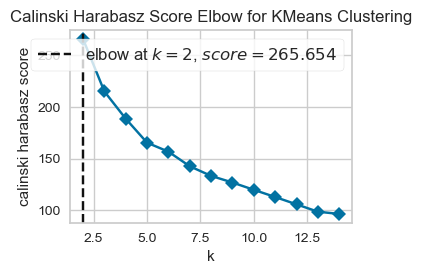

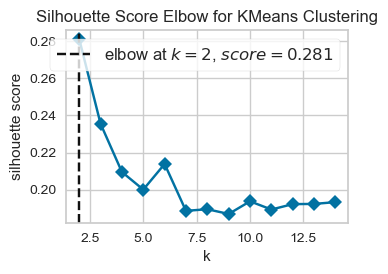

<Axes: title={'center': 'Silhouette Score Elbow for KMeans Clustering'}, xlabel='k', ylabel='silhouette score'>

In [22]:
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
from sklearn.cluster import KMeans
from yellowbrick.cluster import KElbowVisualizer

# Add all QB-relevant features
qb_features = [
    'completions', 'attempts', 'passing_yards', 'passing_tds', 'interceptions', 
    'sacks', 'sack_yards', 'sack_fumbles', 'sack_fumbles_lost',
    'passing_air_yards', 'passing_yards_after_catch', 'passing_first_downs', 
    'passing_epa', 'passing_2pt_conversions', 'pacr', 'carries'
]

# Fill missing features with 0s (assuming qb_df exists)
qb_clean = qb_df[qb_features].fillna(0)

# Scale the data
scaler = StandardScaler()
qb_scaled = scaler.fit_transform(qb_clean)

# Optional: PCA for dimensionality reduction
pca = PCA(n_components=2)
qb_pca = pca.fit_transform(qb_scaled)

# Determine optimal number of clusters using KElbowVisualizer
plt.subplot(2, 2, 1)
model = KMeans(random_state=42)
visualizer = KElbowVisualizer(
    model, 
    k=(2, 15), 
    metric='calinski_harabasz',  # 'silhouette'
    locate_elbow=True, 
    timings=False
)

# Fit to PCA-transformed data
visualizer.fit(qb_scaled)
visualizer.show()

plt.subplot(2, 2, 2)
# Determine optimal number of clusters using KElbowVisualizer
model = KMeans(random_state=42)
visualizer = KElbowVisualizer(
    model, 
    k=(2, 15), 
    metric='silhouette',  # 'silhouette'
    locate_elbow=True, 
    timings=False
)
# Fit to PCA-transformed data
visualizer.fit(qb_scaled)
visualizer.show()


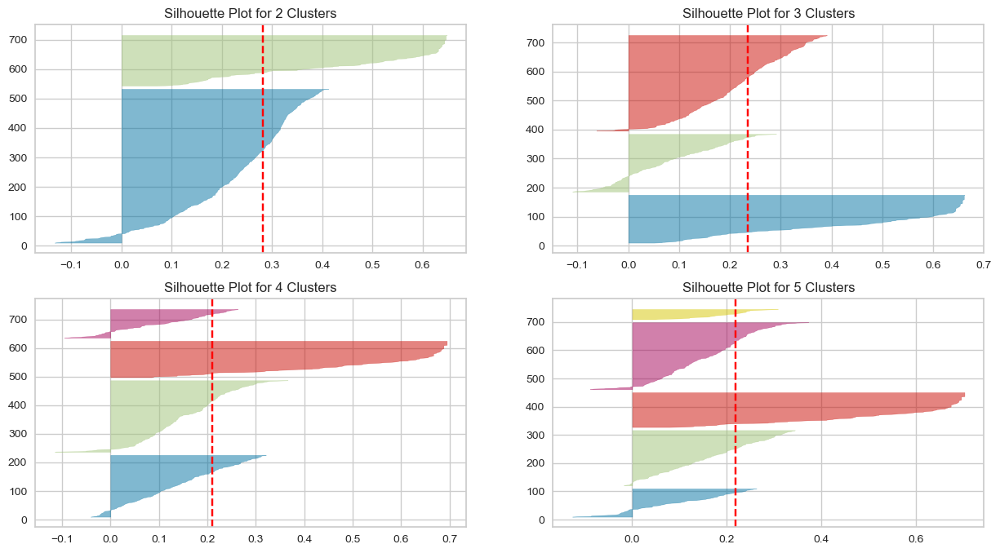

In [23]:
from yellowbrick.cluster import SilhouetteVisualizer
  
fig, ax = plt.subplots(2, 2, figsize=(15,8))
for i in [2, 3, 4, 5]:
    '''
    Create KMeans instances for different number of clusters
    '''
    km = KMeans(n_clusters=i, init='k-means++', n_init=10, max_iter=100, random_state=42)
    q, mod = divmod(i, 2)
    row_index = q - 1
    col_index = mod
    '''
    Create SilhouetteVisualizer instance with KMeans instance
    Fit the visualizer
    '''
    visualizer = SilhouetteVisualizer(km, colors='yellowbrick', ax=ax[q-1][mod])
    visualizer.fit(qb_scaled) 
    ax[row_index][col_index].set_title(f'Silhouette Plot for {i} Clusters')


In [24]:
#Double checking the selection of k and silhouette score
from sklearn.metrics import silhouette_score

best_k = 0
best_score = -1

# Try k from 2 to 9
for k in range(2, 10):
    kmeans = KMeans(n_clusters=k, random_state=42, n_init=10)
    labels = kmeans.fit_predict(qb_scaled)
    score = silhouette_score(qb_scaled, labels)
    
    print(f"K={k} → Silhouette Score: {score:.4f}")
    
    if score > best_score:
        best_score = score
        best_k = k

# Final result
print(f"\n Best K: {best_k} with Silhouette Score: {best_score:.4f}")



K=2 → Silhouette Score: 0.2811
K=3 → Silhouette Score: 0.2352
K=4 → Silhouette Score: 0.2093
K=5 → Silhouette Score: 0.2190
K=6 → Silhouette Score: 0.2078
K=7 → Silhouette Score: 0.2064
K=8 → Silhouette Score: 0.1922
K=9 → Silhouette Score: 0.1869

 Best K: 2 with Silhouette Score: 0.2811


In [25]:
from sklearn.metrics import davies_bouldin_score
#Davies Bouldin looks for the lowest score

best_k = 0
best_score = 5

# Try k from 2 to 9
for k in range(2, 10):
    kmeans = KMeans(n_clusters=k, random_state=42, n_init=10)
    labels = kmeans.fit_predict(qb_scaled)
    score = davies_bouldin_score(qb_scaled, labels)
    
    print(f"K={k} → Davies Bouldin Score: {score:.4f}")

    if score < best_score:
        best_score = score
        best_k = k

# Final result
print(f"\n Best K: {best_k} with Davies Bouldin Score: {best_score:.4f}")

K=2 → Davies Bouldin Score: 1.1946
K=3 → Davies Bouldin Score: 1.7494
K=4 → Davies Bouldin Score: 1.6856
K=5 → Davies Bouldin Score: 1.5574
K=6 → Davies Bouldin Score: 1.6021
K=7 → Davies Bouldin Score: 1.5986
K=8 → Davies Bouldin Score: 1.6352
K=9 → Davies Bouldin Score: 1.6431

 Best K: 2 with Davies Bouldin Score: 1.1946


In [26]:
from sklearn.metrics import calinski_harabasz_score

best_cscore = -1
best_k = 0

for i in range(2, 10):
    kmeans = KMeans(n_clusters=i, random_state=0, n_init=10)
    labels = kmeans.fit_predict(qb_scaled)  # use updated model here

    score = calinski_harabasz_score(qb_scaled, labels)
    print(f"K={i} → Calinski-Harabasz Score (wr_scaled): {score:.2f}")

    if score > best_cscore:
        best_cscore = score
        best_k = i

print(f"\nBest K: {best_k} with Calinski-Harabasz Score: {best_cscore:.4f}")


K=2 → Calinski-Harabasz Score (wr_scaled): 265.65
K=3 → Calinski-Harabasz Score (wr_scaled): 214.91
K=4 → Calinski-Harabasz Score (wr_scaled): 188.74
K=5 → Calinski-Harabasz Score (wr_scaled): 169.42
K=6 → Calinski-Harabasz Score (wr_scaled): 157.40
K=7 → Calinski-Harabasz Score (wr_scaled): 144.88
K=8 → Calinski-Harabasz Score (wr_scaled): 134.78
K=9 → Calinski-Harabasz Score (wr_scaled): 126.91

Best K: 2 with Calinski-Harabasz Score: 265.6539


#### K-MEANS

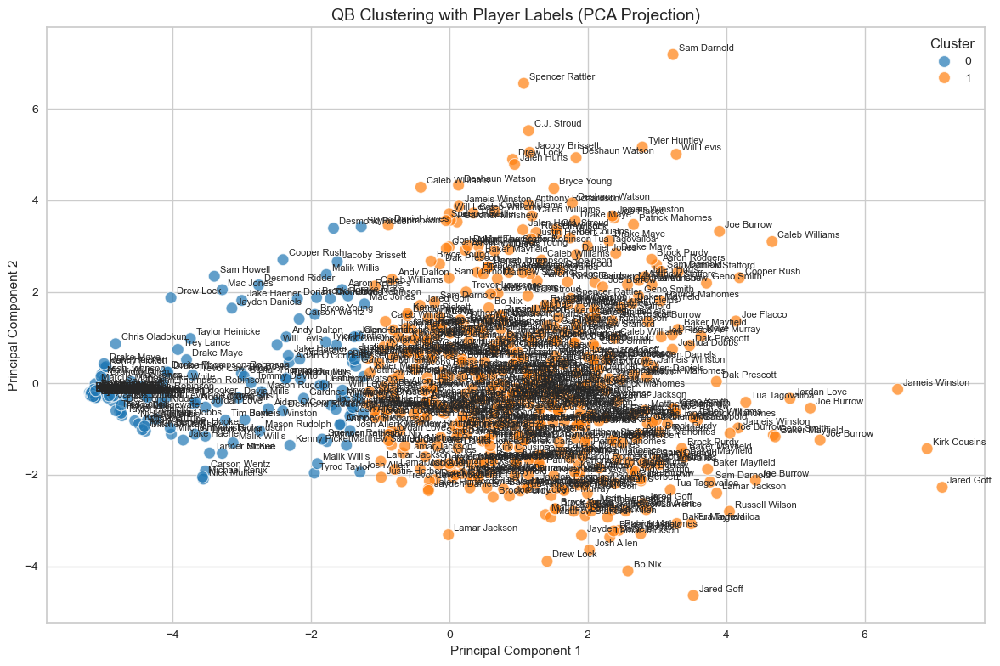

In [27]:
#K-means
kmeans = KMeans(n_clusters=2, random_state=42)
qb_df['cluster'] = kmeans.fit_predict(qb_pca)

#Add PCA components back to DataFrame for plotting
qb_df['PCA1'] = qb_pca[:, 0]
qb_df['PCA2'] = qb_pca[:, 1]


plt.figure(figsize=(12, 8))
# Scatter plot with cluster coloring
sns.scatterplot(data=qb_df, x='PCA1', y='PCA2', hue='cluster', palette='tab10', s=100, alpha=0.7)
# Add player name annotations
for _, row in qb_df.iterrows():
    plt.text(
        row['PCA1'] + 0.08,  # small offset to prevent overlap
        row['PCA2'] + 0.08,
        row['player_display_name'],
        fontsize=8
    )
plt.title("QB Clustering with Player Labels (PCA Projection)", fontsize=14)
plt.xlabel("Principal Component 1")
plt.ylabel("Principal Component 2")
plt.legend(title="Cluster")
plt.grid(True)
plt.tight_layout()
plt.show()



Cluster 0: 
- Generally more left-shifted in PCA space (Principal Component 1 < 0).
- Contains QBs with more conservative, compact distributions — less spread in both components.

Cluster 1:
- Much broader spread, especially in the positive direction of Principal Component 1 and 2.
- Contains players with more variance in performance and possibly role — e.g., Sam Darnold, Spencer Rattler, Jameis Winston, Jared Goff.
More clustered names may indicate higher variance or situational usage.

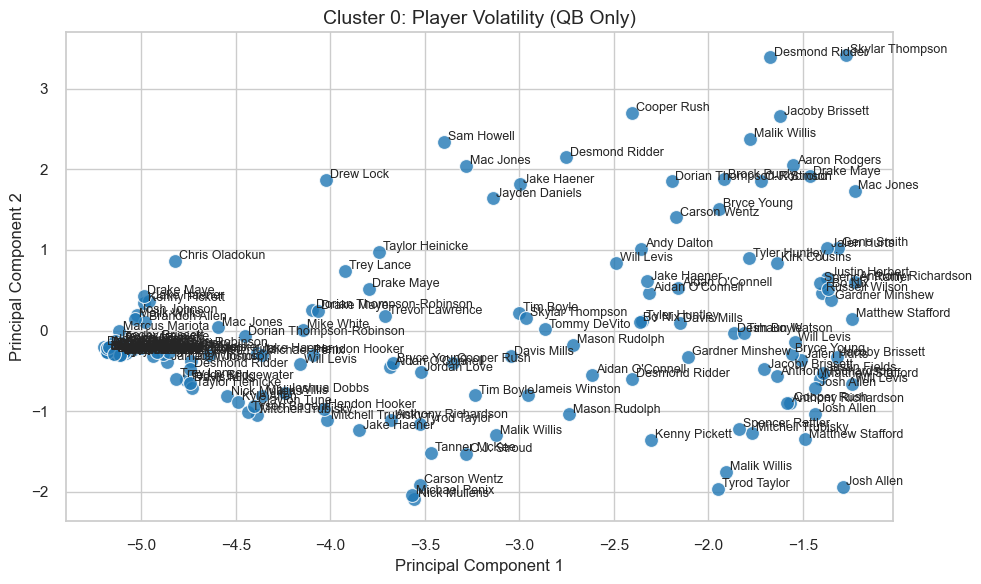

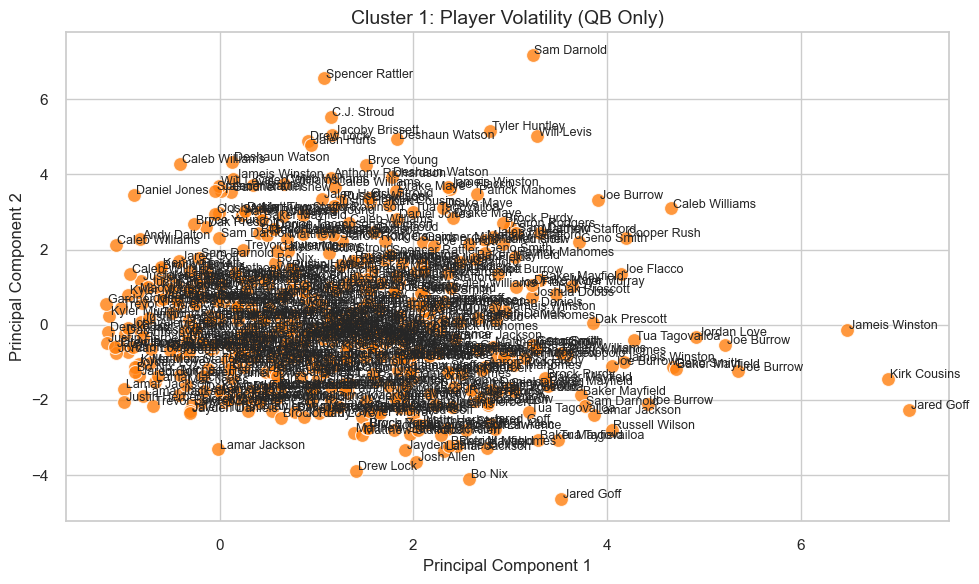

In [28]:
# Get unique clusters
unique_clusters = qb_df['cluster'].unique()

# Set plot style
sns.set(style="whitegrid")

# Create a subplot for each cluster
for cluster_label in sorted(unique_clusters):
    cluster_data = qb_df[qb_df['cluster'] == cluster_label]
    plt.figure(figsize=(10, 6))
    # Scatter plot
    sns.scatterplot(data=cluster_data,x='PCA1',y='PCA2',color=sns.color_palette('tab10')[cluster_label],s=100,alpha=0.8 )
    # Add player name annotations
    for _, row in cluster_data.iterrows():
        plt.text(
            row['PCA1'] + 0.02,
            row['PCA2'] + 0.02,
            row['player_display_name'],
            fontsize=9
        )
    
    plt.title(f"Cluster {cluster_label}: Player Volatility (QB Only)", fontsize=14)
    plt.xlabel("Principal Component 1")
    plt.ylabel("Principal Component 2")
    plt.grid(True)
    plt.tight_layout()
    plt.show()

* Cluster 0:
    * Some QBs like Desmond Ridder, Cooper Rush, and Malik Willis appear in multiple regions, hinting at higher volatility even within this more stable cluster.
    * Others (e.g., Chris Oladokun, Dorian Thompson-Robinson, Marcus Mariota) remain tightly grouped — implying consistent performance and usage.
    * This cluster likely consists of backups, consistent mid-tier starters, or those who aren’t relied upon for game-breaking plays.

* Cluster 1: 
    * Extreme outliers like Spencer Rattler (top), Jared Goff and Jameis Winston (far right) suggest very high volatility, both in performance and cluster assignment over weeks.
    * Core cluster density is higher in the center, but the broad spread along both components supports that this group contains “boom-or-bust” QBs.
    * Players like Joe Burrow, Lamar Jackson, Patrick Mahomes are mixed in here — possibly reflecting high but variable performance outputs week to week.

In [29]:
kmeans = KMeans(n_clusters=2, random_state=0, n_init=10)
kmeans.fit(qb_scaled)


frame = pd.DataFrame(qb_scaled)
pred = kmeans.predict(qb_scaled)
frame['cluster'] = pred
frame['cluster'].value_counts()

0    524
1    173
Name: cluster, dtype: int64

So, there are 524 data points belonging to cluster 1 (index 0), 173 points in cluster 2 (index 1).

#### Decode the PCA Loadings

In [30]:
# Make sure pca components are defined as 2 instead of 3
pca = PCA(n_components=2)
qb_pca = pca.fit_transform(qb_scaled)

pca_components = pca.components_

# DataFrame for PCA loadings
pca_loadings_df = pd.DataFrame(
    pca_components,
    columns=qb_features,  # use actual feature names
    index=[f'PC{i+1}' for i in range(pca.n_components)]
)
pca_loadings_df

# View top contributing features to PC1
#pca_loadings_df.loc['PC1'].sort_values(ascending=False)
#pca_loadings_df.loc['PC2'].sort_values(ascending=False)


,completions,attempts,passing_yards,passing_tds,interceptions,sacks,sack_yards,sack_fumbles,sack_fumbles_lost,passing_air_yards,passing_yards_after_catch,passing_first_downs,passing_epa,passing_2pt_conversions,pacr,carries
PC1,0.378909,0.369809,0.382772,0.253496,0.130207,0.183542,0.171337,0.104503,0.078614,0.315399,0.343761,0.376786,0.112589,0.051316,0.158079,0.108997
PC2,-0.013704,0.057686,-0.096055,-0.236250,0.199880,0.416808,0.422977,0.335976,0.325082,0.091649,-0.143004,-0.109257,-0.486856,-0.020295,-0.194305,-0.065683


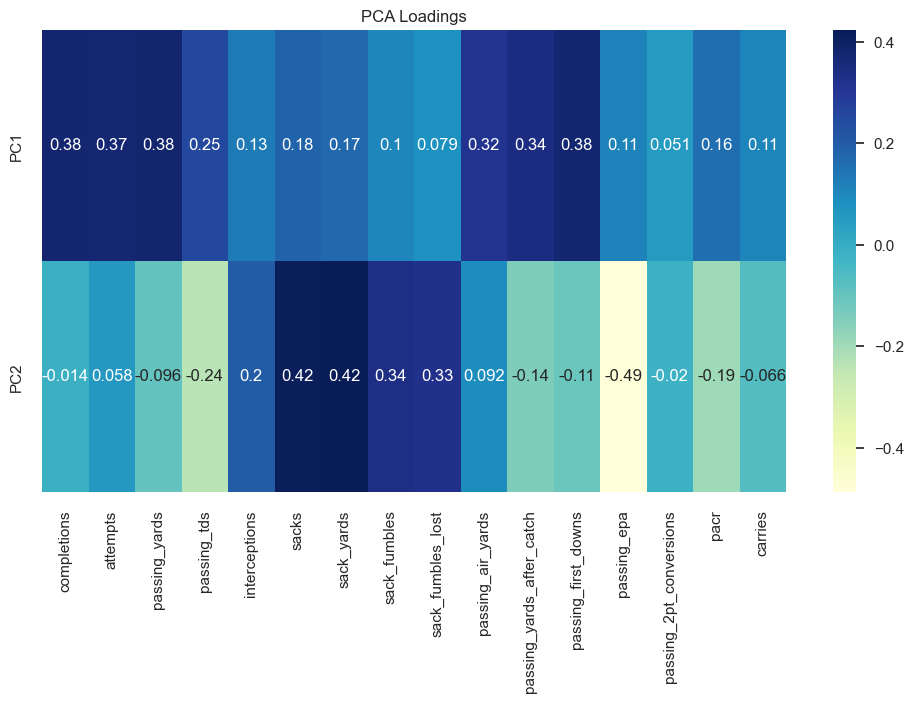

In [31]:
# Heatmap of the loadings
plt.figure(figsize=(12, 6))
sns.heatmap(pca_loadings_df, cmap="YlGnBu", annot=True)
plt.title('PCA Loadings')
plt.show()


#PC1 - completions, attempts, passing yards, passing air yards, passing yards after catch, passing first downs = PASSING STATS
#PC2 - sacks, sack yards = SACKS STATS
#PC2.1 - sack fumbles, sack fumbles lost 
#PC2.2 - (NEGATIVE) passing tds, passing epa

* If PC1 has high loadings for features like "completions", "attempts", and "passing yards", it might represent positive passing statistics
* If PC2 has high loadings for "sacks" and "sack fumbles", and a negative correlatoin from "passing epa" it might represent ... SACKS STATS
* If PC3 has high loadings for "intersections", "passing air yards", "passing 2pt conversions" it might represent ... INTERCEPTIONS STATS


In [32]:
#the amount of variance explained by each of the selected components
pca.explained_variance_ 

array([6.31564984, 2.76580983])

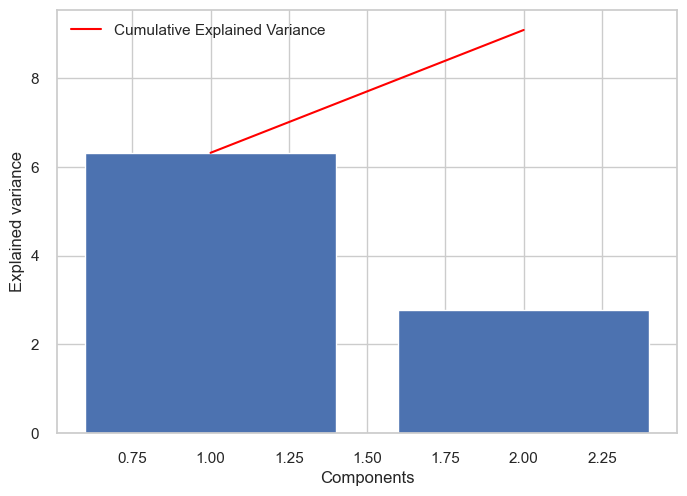

In [33]:

plt.bar(range(1,len(pca.explained_variance_ )+1),pca.explained_variance_ )
plt.ylabel('Explained variance')
plt.xlabel('Components')
plt.plot(range(1,len(pca.explained_variance_ )+1),
         np.cumsum(pca.explained_variance_),
         c='red',
         label="Cumulative Explained Variance")
plt.legend(loc='upper left')

Most of the features are explained and encompassed by PCA1

#### Clusters Week by Week

In [34]:
''' 
# Define features and position
n_clusters = 2

# Loop through each week
for week in sorted(df['week'].unique()):
    # Filter by week and position
    week_df = df[(df['week'] == week) & (df['position'] == 'QB')].copy()

    # Check if there's enough data to cluster
    if len(week_df) < n_clusters:
        print(f"Skipping Week {week} - Not enough players")
        continue

    # Fill missing values and scale features
    X = week_df[qb_features].fillna(0)
    scaler = StandardScaler()
    X_scaled = scaler.fit_transform(X)

    # Apply PCA
    pca = PCA(n_components=2)
    X_pca = pca.fit_transform(X_scaled)

    # Run KMeans
    kmeans = KMeans(n_clusters=n_clusters, random_state=42)
    week_df['cluster'] = kmeans.fit_predict(X_pca)
    week_df['PCA1'] = X_pca[:, 0]
    week_df['PCA2'] = X_pca[:, 1]

    # Plot per cluster for the week
    for cluster_label in sorted(week_df['cluster'].unique()):
        cluster_data = week_df[week_df['cluster'] == cluster_label]

        plt.figure(figsize=(10, 6))
        sns.scatterplot(
            data=cluster_data,
            x='PCA1',
            y='PCA2',
            color=sns.color_palette('tab10')[cluster_label],
            s=100,
            alpha=0.8
        )

        for _, row in cluster_data.iterrows():
            plt.text(
                row['PCA1'] + 0.02,
                row['PCA2'] + 0.02,
                row['player_display_name'],
                fontsize=9
            )

        plt.title(f"QB Clustering - Week {week} - Cluster {cluster_label}", fontsize=14)
        plt.xlabel("Principal Component 1")
        plt.ylabel("Principal Component 2")
        plt.grid(True)
        plt.tight_layout()
        plt.show()
''' 

' \n# Define features and position\nn_clusters = 2\n\n# Loop through each week\nfor week in sorted(df[\'week\'].unique()):\n    # Filter by week and position\n    week_df = df[(df[\'week\'] == week) & (df[\'position\'] == \'QB\')].copy()\n\n    # Check if there\'s enough data to cluster\n    if len(week_df) < n_clusters:\n        print(f"Skipping Week {week} - Not enough players")\n        continue\n\n    # Fill missing values and scale features\n    X = week_df[qb_features].fillna(0)\n    scaler = StandardScaler()\n    X_scaled = scaler.fit_transform(X)\n\n    # Apply PCA\n    pca = PCA(n_components=2)\n    X_pca = pca.fit_transform(X_scaled)\n\n    # Run KMeans\n    kmeans = KMeans(n_clusters=n_clusters, random_state=42)\n    week_df[\'cluster\'] = kmeans.fit_predict(X_pca)\n    week_df[\'PCA1\'] = X_pca[:, 0]\n    week_df[\'PCA2\'] = X_pca[:, 1]\n\n    # Plot per cluster for the week\n    for cluster_label in sorted(week_df[\'cluster\'].unique()):\n        cluster_data = week_df[wee

In [35]:
import plotly.express as px

# Store results
qb_cluster_results = []
position = 'QB'
n_clusters = 2

# Loop through weeks
for week in sorted(df['week'].unique()):
    week_df = df[(df['week'] == week) & (df['position'] == position)].copy()

    if len(week_df) < n_clusters:
        continue  # Skip weeks with too few players

    X = week_df[qb_features].fillna(0)
    scaler = StandardScaler()
    X_scaled = scaler.fit_transform(X)

    pca = PCA(n_components=2)
    X_pca = pca.fit_transform(X_scaled)

    kmeans = KMeans(n_clusters=n_clusters, random_state=42)
    week_df['cluster'] = kmeans.fit_predict(X_pca)

    # Save player, week, and cluster assignment
    for _, row in week_df.iterrows():
        qb_cluster_results.append({
            'player_display_name': row['player_display_name'],
            'week': week,
            'cluster': row['cluster']
        })

# Convert to DataFrame
qb_cluster_history = pd.DataFrame(qb_cluster_results)

# Top 5 QBs by appearance count
top_players = qb_cluster_history['player_display_name'].value_counts().head(5).index.tolist()
plot_data = qb_cluster_history[qb_cluster_history['player_display_name'].isin(top_players)]

# Plotly line plot
fig = px.line(
    plot_data,
    x='week',
    y='cluster',
    color='player_display_name',
    markers=True,
    title="Top 5 QBs - Cluster Assignments Over Time",
    labels={
        'week': 'Week',
        'cluster': 'Cluster Label',
        'player_display_name': 'QB'
    },
    hover_name='player_display_name',
    hover_data={'week': True, 'cluster': True}
)

# Customize layout
fig.update_layout(
    yaxis=dict(tickmode='linear'),
    legend_title_text='QB',
    template='plotly_white'
)

fig.show()


* Patrick - 8
* Lamar - 8
* Jalen - 10
* C.J - 10
* Jayden - 11
* **Jayden Daniels =  BOOM**

* Volatility Metric Explanation
The volatility was measured using standard deviation of PCA-based cluster labels over time per QB, like so:
qb_volatility = qb_cluster_history.groupby('player_display_name')['cluster'].std()

* A higher std means a player switched clusters more often (volatile).
* A lower std means they were usually in the same cluster week to week (consistent).


In [36]:
# Sort by player and week
qb_cluster_history = qb_cluster_history.sort_values(by=['player_display_name', 'week'])

# Calculate cluster changes (week-to-week volatility)
qb_cluster_history['prev_cluster'] = qb_cluster_history.groupby('player_display_name')['cluster'].shift(1)
qb_cluster_history['cluster_changed'] = qb_cluster_history['cluster'] != qb_cluster_history['prev_cluster']
qb_cluster_history['cluster_changed'] = qb_cluster_history['cluster_changed'].fillna(False).astype(int)

# Calculate volatility score (number of changes / total weeks)
volatility_scores = qb_cluster_history.groupby('player_display_name')['cluster_changed'].agg(['sum', 'count'])
volatility_scores['volatility_rate'] = volatility_scores['sum'] / (volatility_scores['count'] - 1)
volatility_scores = volatility_scores.sort_values(by='volatility_rate', ascending=False)
print(volatility_scores)

# Display top 5 most volatile QBs
most_volatile_qbs = volatility_scores.head(5).index.tolist()

# Filter for most volatile QBs
volatile_data = qb_cluster_history[qb_cluster_history['player_display_name'].isin(most_volatile_qbs)]

fig = px.line(
    volatile_data,
    x='week',
    y='cluster',
    color='player_display_name',
    markers=True,
    title="Most Volatile QBs - Cluster Assignments Over Time",
    labels={'week': 'Week', 'cluster': 'Cluster', 'player_display_name': 'QB'},
    hover_name='player_display_name',
    hover_data={'week': True, 'cluster': True}
)

fig.update_layout(
    yaxis=dict(tickmode='linear'),
    legend_title_text='QB',
    template='plotly_white'
)

fig.show()



                     sum  count  volatility_rate
player_display_name                             
Joe Milton             1      1              inf
Teddy Bridgewater      1      1              inf
Kyle Allen             1      1              inf
Mike White             1      1              inf
Sam Howell             1      1              inf
...                  ...    ...              ...
Anthony Richardson     4     11         0.400000
Malik Willis           2      6         0.400000
Geno Smith             6     17         0.375000
Joe Flacco             2      7         0.333333
Justin Herbert         4     18         0.235294

[79 rows x 3 columns]


In [37]:
# Least volatile QBs (lowest cluster change rate)
least_volatile_qbs = volatility_scores.sort_values(by='volatility_rate', ascending=True).head(5).index.tolist()


# Filter data for least volatile QBs
least_volatile_data = qb_cluster_history[qb_cluster_history['player_display_name'].isin(least_volatile_qbs)]

# Interactive line plot
fig = px.line(
    least_volatile_data,
    x='week',
    y='cluster',
    color='player_display_name',
    markers=True,
    title="Least Volatile QBs - Cluster Assignments Over Time",
    labels={'week': 'Week', 'cluster': 'Cluster', 'player_display_name': 'QB'},
    hover_name='player_display_name',
    hover_data={'week': True, 'cluster': True}
)

fig.update_layout(
    yaxis=dict(tickmode='linear'),
    legend_title_text='QB',
    template='plotly_white'
)

fig.show()


* Flat horizontal lines = QBs assigned to the same cluster every week
* Useful for identifying reliable, steady performers — often safe picks for coaching or fantasy strategy

* Cluster 2	- This is the largest cluster — likely the "default" group containing the most typical or consistent players.
* Cluster 1	- A moderately sized group — possibly capturing a different playstyle or performance tier.
* Cluster 0 - Very small cluster — could be outliers or extreme cases (e.g., highest or lowest performers).
* Cluster 3	- Another small group — might represent a unique subgroup (e.g., volatile or hybrid-role players).

____
#### Wide Receivers
____

In [38]:
#Double checking the selection of k and silhouette score
from sklearn.metrics import silhouette_score

#WRs
#features relevant to the positions - WR
wr_features = ['receiving_yards', 'receiving_tds', 'receiving_fumbles','receiving_fumbles_lost', 
               'receiving_air_yards','receiving_yards_after_catch', 'receiving_first_downs', 'receiving_epa',
               'receiving_2pt_conversions', 'racr','target_share', 'air_yards_share']
#fill missing features with 0's; not relevant for position
wr_clean = wr_df[wr_features].fillna(0)
#scale the data
scaler = StandardScaler()
wr_scaled = scaler.fit_transform(wr_clean)
#PCA
pca = PCA(n_components=2)
wr_pca = pca.fit_transform(wr_scaled)

best_k = 0
best_score = -1

# Try k from 2 to 9
for k in range(2, 10):
    kmeans = KMeans(n_clusters=k, random_state=42, n_init=10)
    labels = kmeans.fit_predict(wr_scaled)
    score = silhouette_score(wr_scaled, labels)
    
    print(f"K={k} → Silhouette Score: {score:.4f}")
    
    if score > best_score:
        best_score = score
        best_k = k

# Final result
print(f"\n Best K: {best_k} with Silhouette Score: {best_score:.4f}")

K=2 → Silhouette Score: 0.3694
K=3 → Silhouette Score: 0.3834
K=4 → Silhouette Score: 0.3955
K=5 → Silhouette Score: 0.3067
K=6 → Silhouette Score: 0.3079
K=7 → Silhouette Score: 0.2971
K=8 → Silhouette Score: 0.3029
K=9 → Silhouette Score: 0.2243

 Best K: 4 with Silhouette Score: 0.3955


In [39]:
from sklearn.metrics import davies_bouldin_score

best_k = 0
best_score = 5

# Try k from 2 to 9
for k in range(2, 10):
    kmeans = KMeans(n_clusters=k, random_state=42, n_init=10)
    labels = kmeans.fit_predict(wr_scaled)
    score = davies_bouldin_score(wr_scaled, labels)
    
    print(f"K={k} → Davies Bouldin Score: {score:.4f}")
    
    if score < best_score:
        best_score = score
        best_k = k


# Final result
print(f"\n Best K: {best_k} with Davies Bouldin Score: {best_score:.4f}")

K=2 → Davies Bouldin Score: 1.2861
K=3 → Davies Bouldin Score: 0.9889
K=4 → Davies Bouldin Score: 0.8845
K=5 → Davies Bouldin Score: 1.1366
K=6 → Davies Bouldin Score: 1.0414
K=7 → Davies Bouldin Score: 1.1519
K=8 → Davies Bouldin Score: 1.0797
K=9 → Davies Bouldin Score: 1.1177

 Best K: 4 with Davies Bouldin Score: 0.8845


In [40]:
from sklearn.cluster import KMeans
from sklearn.metrics import calinski_harabasz_score

best_cscore = -1
best_k = 0

for i in range(2, 10):
    kmeans = KMeans(n_clusters=i, random_state=0, n_init=10)
    labels = kmeans.fit_predict(wr_scaled)  # use updated model here

    score = calinski_harabasz_score(wr_scaled, labels)
    print(f"K={i} → Calinski-Harabasz Score (wr_scaled): {score:.2f}")

    if score > best_cscore:
        best_cscore = score
        best_k = i

print(f"\nBest K: {best_k} with Calinski-Harabasz Score: {best_cscore:.4f}")


K=2 → Calinski-Harabasz Score (wr_scaled): 874.77
K=3 → Calinski-Harabasz Score (wr_scaled): 759.89
K=4 → Calinski-Harabasz Score (wr_scaled): 694.27
K=5 → Calinski-Harabasz Score (wr_scaled): 684.13
K=6 → Calinski-Harabasz Score (wr_scaled): 672.15
K=7 → Calinski-Harabasz Score (wr_scaled): 657.01
K=8 → Calinski-Harabasz Score (wr_scaled): 649.15
K=9 → Calinski-Harabasz Score (wr_scaled): 628.94

Best K: 2 with Calinski-Harabasz Score: 874.7729


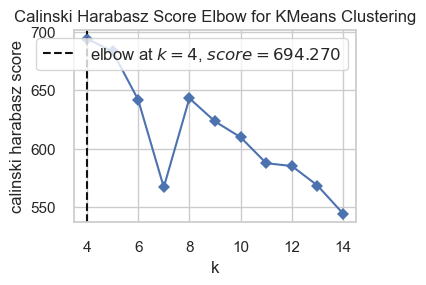

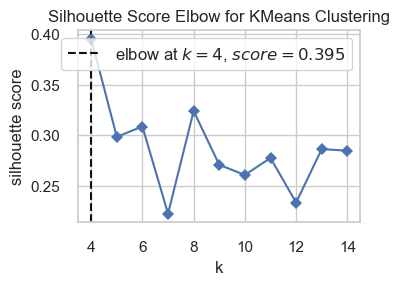

<Axes: title={'center': 'Silhouette Score Elbow for KMeans Clustering'}, xlabel='k', ylabel='silhouette score'>

In [41]:
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
from sklearn.cluster import KMeans
from yellowbrick.cluster import KElbowVisualizer


# Determine optimal number of clusters using KElbowVisualizer
plt.subplot(2, 2, 1)
model = KMeans(random_state=42)
visualizer = KElbowVisualizer(
    model, 
    k=(4, 15), 
    metric='calinski_harabasz',  # 'silhouette'
    locate_elbow=True, 
    timings=False
)
#2 - 874.773  = HIGHEST
#3 - 759.877
#4 - 694.270

# Fit to PCA-transformed data
visualizer.fit(wr_scaled)
visualizer.show()

plt.subplot(2, 2, 2)
# Determine optimal number of clusters using KElbowVisualizer
model = KMeans(random_state=42)
visualizer = KElbowVisualizer(
    model, 
    k=(4, 15), 
    metric='silhouette',  # 'silhouette'
    locate_elbow=True, 
    timings=False
)

#2 - 0.370
#3 - 0.384
#4 - 0.395 = HIGHEST
# Fit to PCA-transformed data
visualizer.fit(wr_scaled)
visualizer.show()

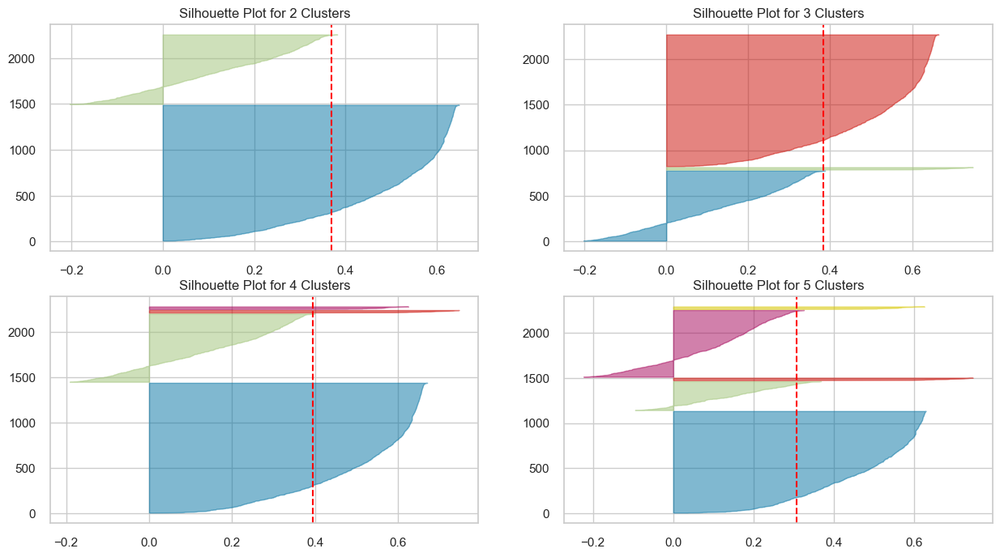

In [42]:
from yellowbrick.cluster import SilhouetteVisualizer
  
fig, ax = plt.subplots(2, 2, figsize=(15,8))
for i in [2, 3, 4, 5]:
    '''
    Create KMeans instances for different number of clusters
    '''
    km = KMeans(n_clusters=i, init='k-means++', n_init=10, max_iter=100, random_state=42)
    q, mod = divmod(i, 2)
    row_index = q - 1
    col_index = mod
    '''
    Create SilhouetteVisualizer instance with KMeans instance
    Fit the visualizer
    '''
    visualizer = SilhouetteVisualizer(km, colors='yellowbrick', ax=ax[q-1][mod])
    visualizer.fit(wr_scaled) 
    ax[row_index][col_index].set_title(f'Silhouette Plot for {i} Clusters')

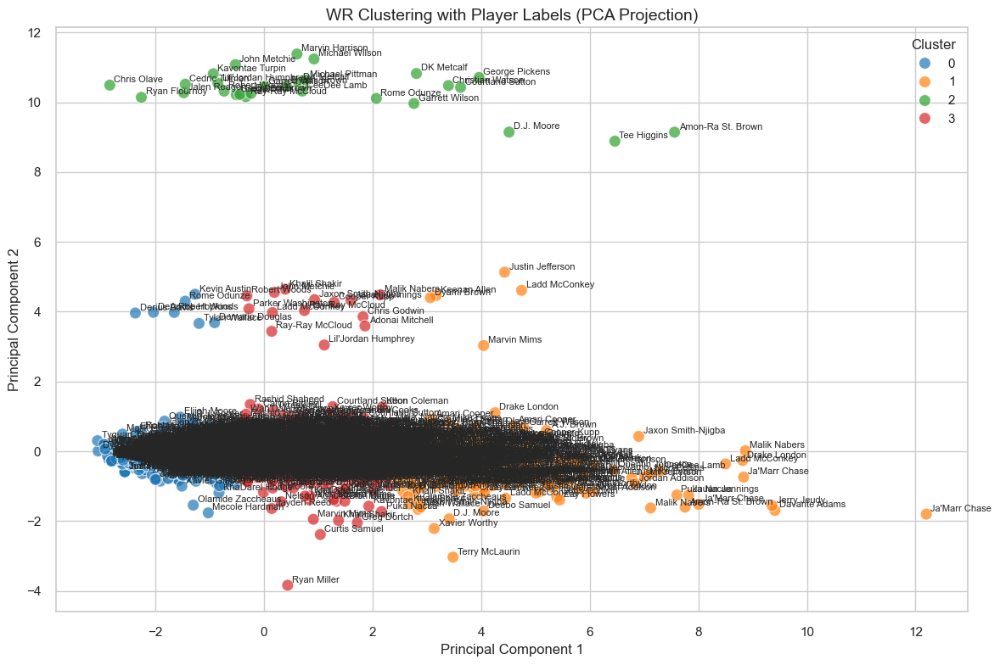

In [43]:
#K-means
kmeans = KMeans(n_clusters=4, random_state=42)
wr_df['cluster'] = kmeans.fit_predict(wr_pca)
#Add PCA components back to DataFrame for plotting
wr_df['PCA1'] = wr_pca[:, 0]
wr_df['PCA2'] = wr_pca[:, 1]

#Cluster plot
plt.figure(figsize=(12, 8))
# Scatter plot with cluster coloring
sns.scatterplot(data=wr_df, x='PCA1', y='PCA2', hue='cluster', palette='tab10', s=100, alpha=0.7)
# Add player name annotations
for _, row in wr_df.iterrows():
    plt.text(
        row['PCA1'] + 0.08,  # small offset to prevent overlap
        row['PCA2'] + 0.08,
        row['player_display_name'],
        fontsize=8
    )

plt.title("WR Clustering with Player Labels (PCA Projection)", fontsize=14)
plt.xlabel("Principal Component 1")
plt.ylabel("Principal Component 2")
plt.legend(title="Cluster")
plt.grid(True)
plt.tight_layout()
plt.show()


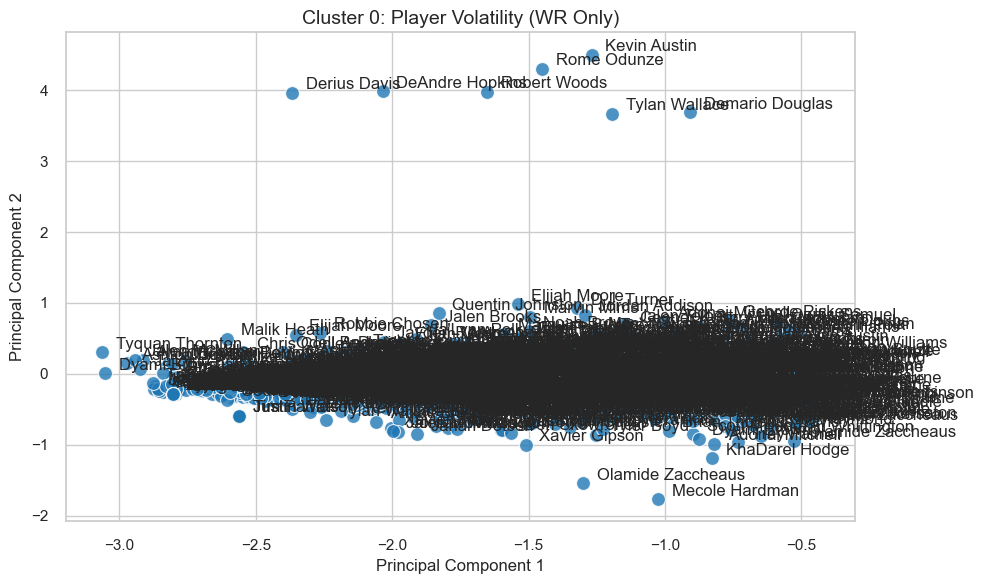

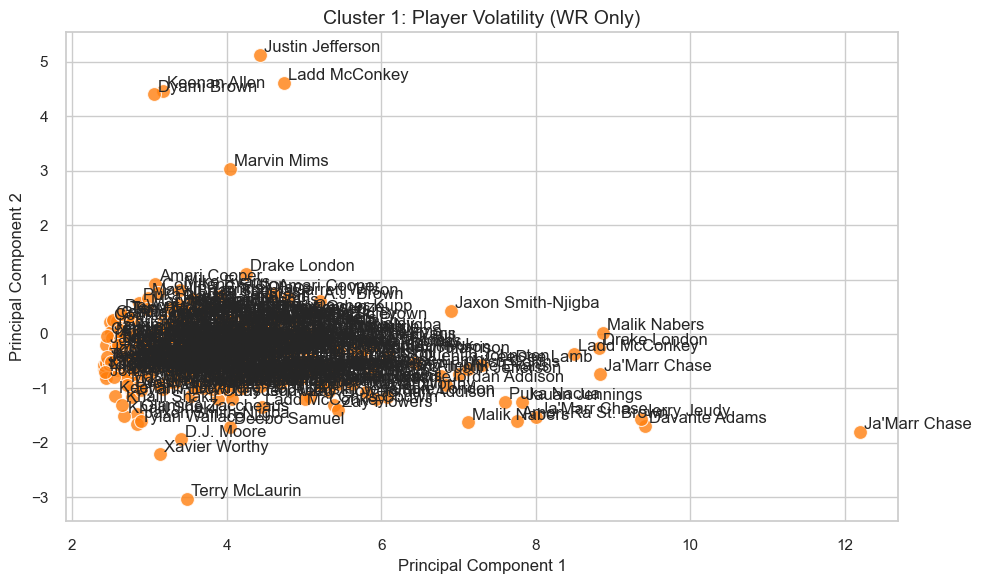

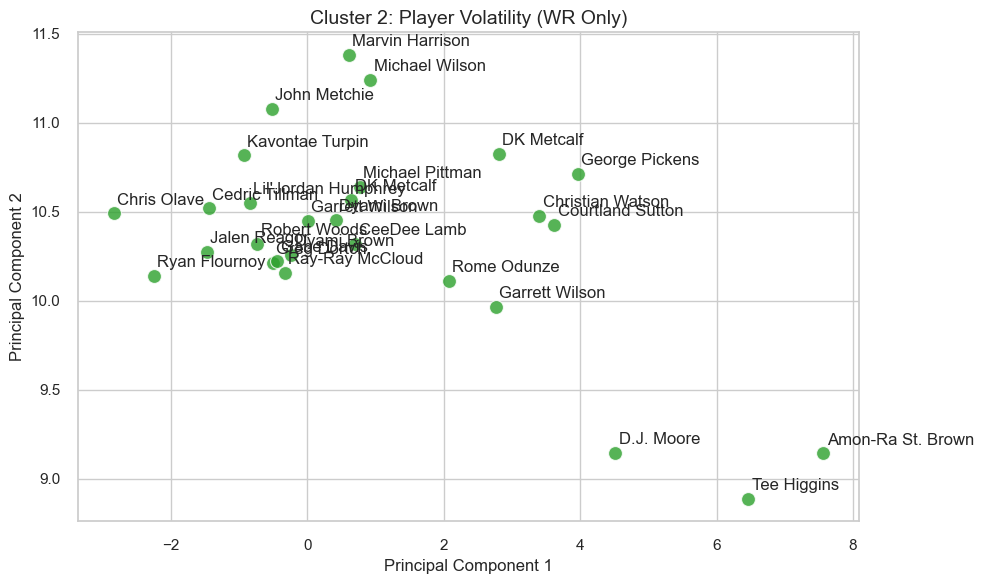

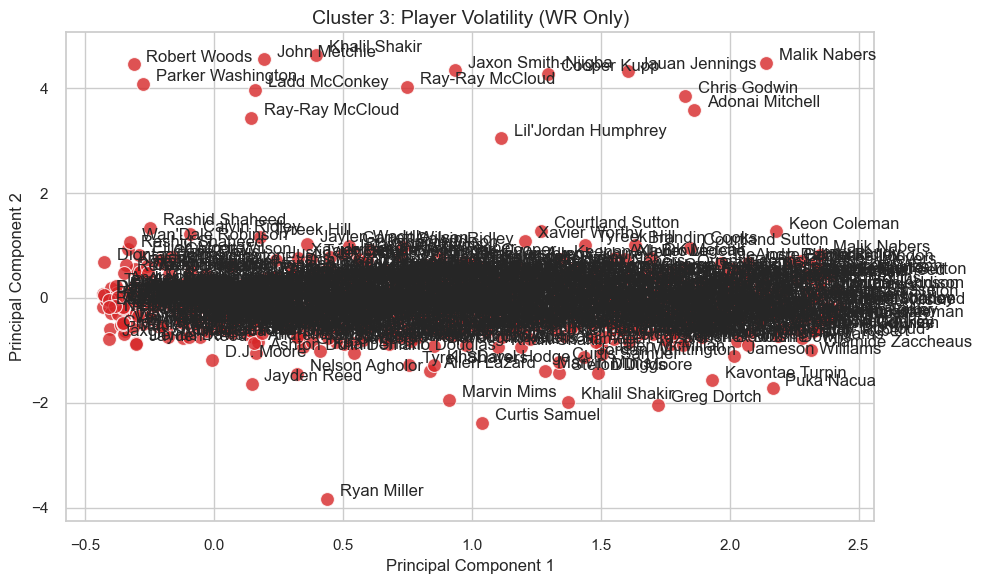

In [44]:
# Get unique clusters
unique_clusters = wr_df['cluster'].unique()
# Set plot style
sns.set(style="whitegrid")

# Create a subplot for each cluster
for cluster_label in sorted(unique_clusters):
    cluster_data = wr_df[wr_df['cluster'] == cluster_label]
    plt.figure(figsize=(10, 6))
    # Scatter plot
    sns.scatterplot(data=cluster_data,x='PCA1',y='PCA2',color=sns.color_palette('tab10')[cluster_label],s=100,alpha=0.8 )
    # Add player name annotations
    for _, row in cluster_data.iterrows():
        plt.text(
            row['PCA1'] + 0.05,
            row['PCA2'] + 0.05,
            row['player_display_name'],
            fontsize=12
        )
    
    plt.title(f"Cluster {cluster_label}: Player Volatility (WR Only)", fontsize=14)
    plt.xlabel("Principal Component 1")
    plt.ylabel("Principal Component 2")
    plt.grid(True)
    plt.tight_layout()
    plt.show()

In [45]:
kmeans = KMeans(n_clusters=4, random_state=0, n_init=10)
kmeans.fit(wr_scaled)

frame = pd.DataFrame(wr_scaled)
frame['cluster'] = kmeans.predict(wr_scaled)
print(frame['cluster'].value_counts())


2    1429
1     752
0      29
3      28
Name: cluster, dtype: int64


* Cluster 2	- This is the largest cluster — likely the "default" group containing the most typical or consistent players.
* Cluster 1	- A moderately sized group — possibly capturing a different playstyle or performance tier.
* Cluster 0 - Very small cluster — could be outliers or extreme cases (e.g., highest or lowest performers).
* Cluster 3	- Another small group — might represent a unique subgroup (e.g., volatile or hybrid-role players).

In [46]:
kmeans = KMeans(n_clusters=4, random_state=0, n_init=10)
pred = kmeans.fit_predict(wr_scaled)

# Rebuild the DataFrame using the scaled values and feature names
full_data = pd.DataFrame(wr_scaled, columns=wr_features)

# Add cluster assignments
full_data['cluster'] = pred

# Group by cluster and compute mean stats
cluster_summary = full_data.groupby('cluster').mean()
cluster_summary

,receiving_yards,receiving_tds,receiving_fumbles,receiving_fumbles_lost,receiving_air_yards,receiving_yards_after_catch,receiving_first_downs,receiving_epa,receiving_2pt_conversions,racr,target_share,air_yards_share
cluster,,,,,,,,,,,,
0,0.508536,0.050455,-0.157243,-0.112560,0.398575,0.549547,0.451937,0.308024,8.727681,-0.024682,0.175527,0.170156
1,1.042294,0.635479,-0.044585,-0.112560,0.889973,0.753383,1.023192,0.700169,-0.114578,0.131171,0.989173,0.909874
2,-0.570714,-0.334054,-0.097957,-0.112560,-0.484012,-0.413891,-0.553033,-0.356682,-0.114578,-0.069879,-0.532831,-0.489648
3,0.607066,-0.070723,6.359595,8.884175,0.386943,0.320344,0.276350,-0.920020,-0.114578,0.069023,0.445260,0.376661


* Cluster 0: Mildly positive in YAC, EPA, 1st downs, negative in TDs & RACR, High 2PT conversions - 8.7 (a bug or extreme outlier) = mid-level WRs with some playmaking ability, but not heavy scorers 
* Cluster 1: Very strong across almost all features, especially EPA, TDs, air yards, High in target share, receiving yards, and RACR = Elite WR1 group — high involvement and production, likely includes players like Tyreek Hill, Jefferson, Chase, etc.
* Cluster 2: Heavily negative across all features = Low-usage WRs — backups, special teams, or inactive players
* Cluster 3: Big outlier values in fumbles - 6.35 and 8.88 (data error , check for faulty rows or WR with very few snaps but massive fumble impact), and negative EPA and Yards =  Possibly a data anomaly cluster OR risky/high-volatility WRs who’ve made big mistakes

In [47]:
# Assuming you have a DataFrame called full_data with 'cluster' column
cluster_labels_map = {
    0: 'WR2 = Consistent',
    1: 'WR1 = Elite',
    2: 'Bench = Low-Usage',
    3: 'Volatile = Outlier'
}

# Create a new labeled column
full_data['cluster_label'] = full_data['cluster'].map(cluster_labels_map)
wr_df['cluster'] = pred  # KMeans predictions
wr_df['cluster_label'] = wr_df['cluster'].map(cluster_labels_map)
wr_df.to_csv("labeled_wr_clusters.csv", index=False)

In [48]:
# Make sure pca components are defined as 2 instead of 3
pca = PCA(n_components=2)
wr_pca = pca.fit_transform(wr_scaled)

pca_components = pca.components_

# DataFrame for PCA loadings
pca_loadings_df_wr = pd.DataFrame(
    pca_components,
    columns=wr_features,  # use actual feature names
    index=[f'PC{i+1}' for i in range(pca.n_components)]
)
pca_loadings_df_wr


,receiving_yards,receiving_tds,receiving_fumbles,receiving_fumbles_lost,receiving_air_yards,receiving_yards_after_catch,receiving_first_downs,receiving_epa,receiving_2pt_conversions,racr,target_share,air_yards_share
PC1,0.428533,0.262082,0.029194,0.023539,0.351093,0.319502,0.410966,0.288364,0.027597,0.061489,0.380837,0.345387
PC2,-0.014066,-0.108019,0.655008,0.660709,0.122671,-0.073577,-0.039149,-0.242417,-0.035200,-0.134702,0.087980,0.121149


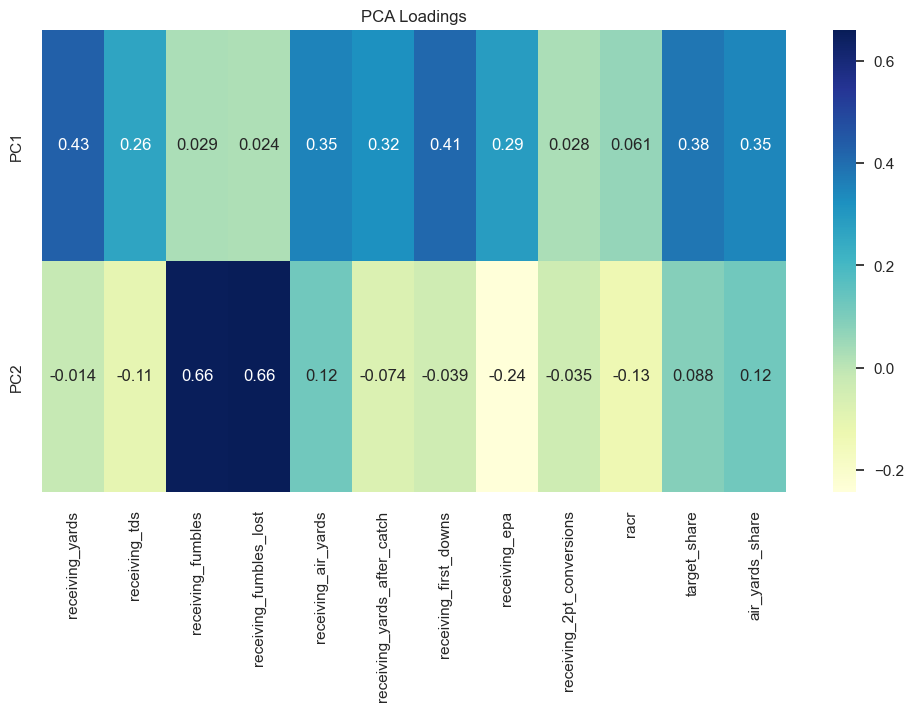

In [49]:
# Heatmap of the loadings
plt.figure(figsize=(12, 6))
sns.heatmap(pca_loadings_df_wr, cmap="YlGnBu", annot=True)
plt.title('PCA Loadings')
plt.show()


#PC1 - receiving yards, receiving first downs = receiving STATS
#PC2 - receiving fumbles, receiving fumbles lost, sack yards = FUMBLES STATS
#   and has negative values for all other features except air yards, target share and air yards share

[4.89697849 1.76406684]


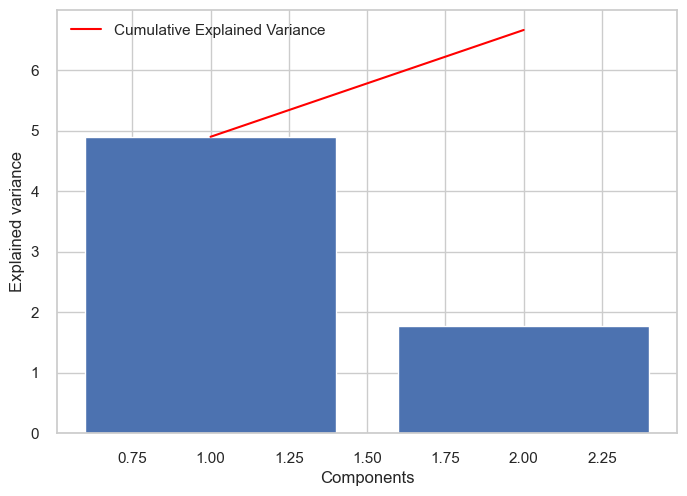

In [50]:
print(pca.explained_variance_) 
plt.bar(range(1,len(pca.explained_variance_ )+1),pca.explained_variance_ )
plt.ylabel('Explained variance')
plt.xlabel('Components')
plt.plot(range(1,len(pca.explained_variance_ )+1),
         np.cumsum(pca.explained_variance_),
         c='red',
         label="Cumulative Explained Variance")
plt.legend(loc='upper left')


Most of the features are explain in PC1

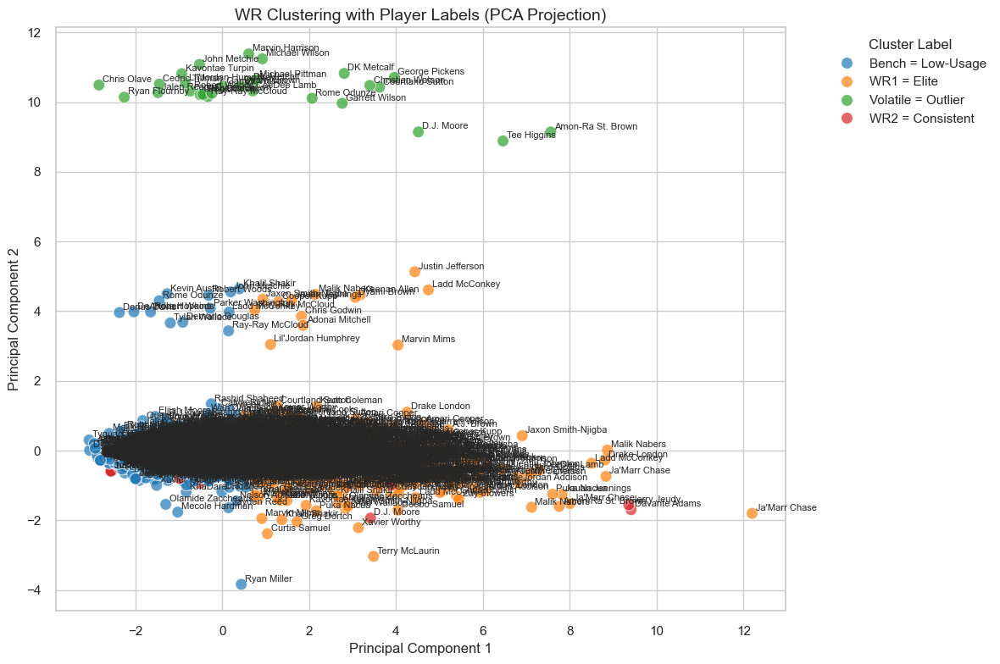

In [51]:
wr_df['cluster_label'] = wr_df['cluster'].map(cluster_labels_map)

plt.figure(figsize=(12, 8))
sns.scatterplot(
    data=wr_df,
    x='PCA1',
    y='PCA2',
    hue='cluster_label',  # <--- use mapped labels
    palette='tab10',
    s=100,
    alpha=0.7
)

# Add player names
for _, row in wr_df.iterrows():
    plt.text(
        row['PCA1'] + 0.08,
        row['PCA2'] + 0.08,
        row['player_display_name'],
        fontsize=8
    )

plt.title("WR Clustering with Player Labels (PCA Projection)", fontsize=14)
plt.xlabel("Principal Component 1")
plt.ylabel("Principal Component 2")
plt.legend(title="Cluster Label", bbox_to_anchor=(1.05, 1), loc='upper left')
plt.grid(True)
plt.tight_layout()
plt.show()


In [52]:
# Final storage for weekly WR cluster results (ALL clusters)
wr_cluster_results = []

position = 'WR'
n_clusters = 4
# Loop through weeks and record ALL WRs
for week in sorted(df['week'].unique()):
    week_df = df[(df['week'] == week) & (df['position'] == position)].copy()

    if len(week_df) < n_clusters:
        continue

    X = week_df[wr_features].fillna(0)
    scaler = StandardScaler()
    X_scaled = scaler.fit_transform(X)

    pca = PCA(n_components=2)
    X_pca = pca.fit_transform(X_scaled)

    kmeans = KMeans(n_clusters=n_clusters, random_state=42)
    week_df['cluster'] = kmeans.fit_predict(X_pca)
    week_df['cluster_label'] = week_df['cluster'].map(cluster_labels_map)

    # ✅ Store ALL WRs regardless of cluster label
    for _, row in week_df.iterrows():
        wr_cluster_results.append({
            'player_display_name': row['player_display_name'],
            'week': row['week'],
            'cluster': row['cluster']
        })

# Create cluster history DataFrame
wr_cluster_history = pd.DataFrame(wr_cluster_results)

# Sort by player and week
wr_cluster_history = wr_cluster_history.sort_values(by=['player_display_name', 'week'])

# Calculate week-to-week cluster change
wr_cluster_history['prev_cluster'] = wr_cluster_history.groupby('player_display_name')['cluster'].shift(1)
wr_cluster_history['cluster_changed'] = wr_cluster_history['cluster'] != wr_cluster_history['prev_cluster']
wr_cluster_history['cluster_changed'] = wr_cluster_history['cluster_changed'].fillna(False).astype(int)

# Compute volatility score (cluster change rate)
volatility_scores = wr_cluster_history.groupby('player_display_name')['cluster_changed'].agg(['sum', 'count'])
volatility_scores = volatility_scores[volatility_scores['count'] > 1]  # avoid div/0
volatility_scores['volatility_rate'] = volatility_scores['sum'] / (volatility_scores['count'] - 1)
print(volatility_scores)

# Sort and get top 5 most volatile WRs
volatility_scores = volatility_scores.sort_values(by='volatility_rate', ascending=False)
most_volatile_wrs = volatility_scores.head(5).index.tolist()


# Extract their cluster history for plotting
volatile_data = wr_cluster_history[wr_cluster_history['player_display_name'].isin(most_volatile_wrs)]

# Plot

fig = px.line(
    volatile_data,
    x='week',
    y='cluster',
    color='player_display_name',
    markers=True,
    title="Most Volatile WRs (All Clusters)",
    labels={'week': 'Week', 'cluster': 'Cluster', 'player_display_name': 'WR'},
    hover_name='player_display_name',
    hover_data={'week': True, 'cluster': True}
)

fig.update_layout(
    yaxis=dict(tickmode='linear'),
    legend_title_text='WR',
    template='plotly_white'
)

fig.show()



                     sum  count  volatility_rate
player_display_name                             
A.J. Brown            14     17         0.875000
Adam Thielen           5     10         0.555556
Adonai Mitchell       13     17         0.812500
Ainias Smith           2      3         1.000000
Alec Pierce           12     16         0.800000
...                  ...    ...              ...
Xavier Smith           2      3         1.000000
Xavier Weaver          2      2         2.000000
Xavier Worthy         17     19         0.944444
Zay Flowers           11     17         0.687500
Zay Jones              4      6         0.800000

[201 rows x 3 columns]


In [53]:
wr_cluster_results = []

position = 'WR'
n_clusters = 4
# Loop through weeks
for week in sorted(df['week'].unique()):
    week_df = df[(df['week'] == week) & (df['position'] == position)].copy()

    if len(week_df) < n_clusters:
        continue

    X = week_df[wr_features].fillna(0)
    scaler = StandardScaler()
    X_scaled = scaler.fit_transform(X)

    pca = PCA(n_components=2)
    X_pca = pca.fit_transform(X_scaled)

    kmeans = KMeans(n_clusters=n_clusters, random_state=42)
    week_df['cluster'] = kmeans.fit_predict(X_pca)
    week_df['cluster_label'] = week_df['cluster'].map(cluster_labels_map)


    for _, row in wr_df.iterrows():
        wr_cluster_results.append({
            'player_display_name': row['player_display_name'],
            'week': row['week'],
            'cluster': row['cluster']
        })

# Process volatility history
wr_cluster_history = pd.DataFrame(wr_cluster_results)
wr_cluster_history = wr_cluster_history.sort_values(by=['player_display_name', 'week'])
wr_cluster_history['prev_cluster'] = wr_cluster_history.groupby('player_display_name')['cluster'].shift(1)
wr_cluster_history['cluster_changed'] = wr_cluster_history['cluster'] != wr_cluster_history['prev_cluster']
wr_cluster_history['cluster_changed'] = wr_cluster_history['cluster_changed'].fillna(False).astype(int)

volatility_scores = wr_cluster_history.groupby('player_display_name')['cluster_changed'].agg(['sum', 'count'])
volatility_scores['volatility_rate'] = volatility_scores['sum'] / (volatility_scores['count'] - 1)
volatility_scores = volatility_scores.sort_values(by='volatility_rate', ascending=False)

print(volatility_scores)

# ✅ Least volatile WRs
least_volatile_wrs = volatility_scores.tail(5).index.tolist()
least_volatile_data = wr_cluster_history[wr_cluster_history['player_display_name'].isin(least_volatile_wrs)]

fig = px.line(
    least_volatile_data,
    x='week',
    y='cluster',
    color='player_display_name',
    markers=True,
    title="Least Volatile WRs - Cluster Assignments Over Time",
    labels={'week': 'Week', 'cluster': 'Cluster', 'player_display_name': 'WR'},
    hover_name='player_display_name',
    hover_data={'week': True, 'cluster': True}
)

fig.update_layout(
    yaxis=dict(tickmode='linear'),
    legend_title_text='WR',
    template='plotly_white'
)

fig.show()


                     sum  count  volatility_rate
player_display_name                             
John Ross              1     22         0.047619
Irvin Charles          1     22         0.047619
Tyler Scott            1     22         0.047619
Cody White             1     22         0.047619
Trent Taylor           1     22         0.047619
...                  ...    ...              ...
Luke McCaffrey         1    286         0.003509
Nico Collins           1    308         0.003257
Jonathan Mingo         1    308         0.003257
Nelson Agholor         1    330         0.003040
Xavier Hutchinson      1    352         0.002849

[228 rows x 3 columns]


____
#### Running Backs
____

In [54]:
#Double checking the selection of k and silhouette score
from sklearn.metrics import silhouette_score

#WRs
#features relevant to the positions - WR
rb_features = ['carries', 'rushing_yards','rushing_tds', 'rushing_fumbles', 'rushing_fumbles_lost',
       'rushing_first_downs', 'rushing_epa', 'rushing_2pt_conversions', 'receptions', 'target_share']
#fill missing features with 0's; not relevant for position
rb_clean = rb_df[rb_features].fillna(0)
#scale the data
scaler = StandardScaler()
rb_scaled = scaler.fit_transform(rb_clean)
#PCA
pca = PCA(n_components=2)
rb_pca = pca.fit_transform(rb_scaled)

best_k = 0
best_score = -1

# Try k from 2 to 9
for k in range(2, 10):
    kmeans = KMeans(n_clusters=k, random_state=42, n_init=10)
    labels = kmeans.fit_predict(rb_scaled)
    score = silhouette_score(rb_scaled, labels)
    
    print(f"K={k} → Silhouette Score: {score:.4f}")
    
    if score > best_score:
        best_score = score
        best_k = k

# Final result
print(f"\n Best K: {best_k} with Silhouette Score: {best_score:.4f}")

K=2 → Silhouette Score: 0.3661
K=3 → Silhouette Score: 0.3947
K=4 → Silhouette Score: 0.3635
K=5 → Silhouette Score: 0.3718
K=6 → Silhouette Score: 0.3341
K=7 → Silhouette Score: 0.3503
K=8 → Silhouette Score: 0.3067
K=9 → Silhouette Score: 0.2806

 Best K: 3 with Silhouette Score: 0.3947


In [55]:
from sklearn.metrics import davies_bouldin_score

best_k = 0
best_score = 5

# Try k from 2 to 9
for k in range(2, 10):
    kmeans = KMeans(n_clusters=k, random_state=42, n_init=10)
    labels = kmeans.fit_predict(rb_scaled)
    score = davies_bouldin_score(rb_scaled, labels)
    
    print(f"K={k} → Davies Bouldin Score: {score:.4f}")
    
    if score < best_score:
        best_score = score
        best_k = k

# Final result
print(f"\n Best K: {best_k} with Davies Bouldin Score: {best_score:.4f}")

K=2 → Davies Bouldin Score: 1.4527
K=3 → Davies Bouldin Score: 1.1392
K=4 → Davies Bouldin Score: 1.2278
K=5 → Davies Bouldin Score: 1.0245
K=6 → Davies Bouldin Score: 1.1920
K=7 → Davies Bouldin Score: 1.1568
K=8 → Davies Bouldin Score: 1.1471
K=9 → Davies Bouldin Score: 1.1940

 Best K: 5 with Davies Bouldin Score: 1.0245


In [56]:
from sklearn.metrics import calinski_harabasz_score

best_cscore = -1
best_k = 0

for i in range(2, 10):
    kmeans = KMeans(n_clusters=i, random_state=0, n_init=10)
    labels = kmeans.fit_predict(rb_scaled)  # use updated model here

    score = calinski_harabasz_score(rb_scaled, labels)
    print(f"K={i} → Calinski-Harabasz Score (rb_scaled): {score:.2f}")

    if score > best_cscore:
        best_cscore = score
        best_k = i

print(f"\nBest K: {best_k} with Calinski-Harabasz Score: {best_cscore:.4f}")

K=2 → Calinski-Harabasz Score (rb_scaled): 482.65
K=3 → Calinski-Harabasz Score (rb_scaled): 501.95
K=4 → Calinski-Harabasz Score (rb_scaled): 496.33
K=5 → Calinski-Harabasz Score (rb_scaled): 539.88
K=6 → Calinski-Harabasz Score (rb_scaled): 505.58
K=7 → Calinski-Harabasz Score (rb_scaled): 482.51
K=8 → Calinski-Harabasz Score (rb_scaled): 463.80
K=9 → Calinski-Harabasz Score (rb_scaled): 443.35

Best K: 5 with Calinski-Harabasz Score: 539.8806


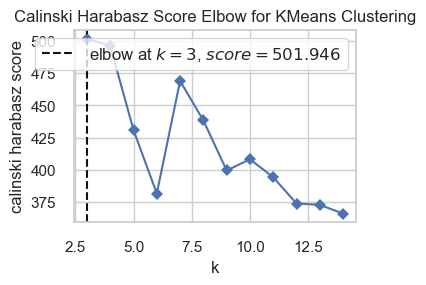

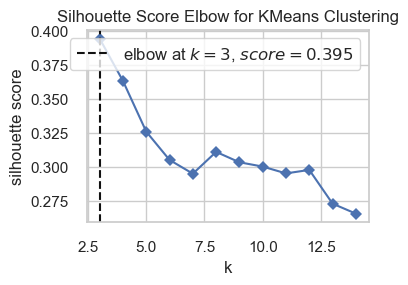

<Axes: title={'center': 'Silhouette Score Elbow for KMeans Clustering'}, xlabel='k', ylabel='silhouette score'>

In [57]:
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
from sklearn.cluster import KMeans
from yellowbrick.cluster import KElbowVisualizer


# Determine optimal number of clusters using KElbowVisualizer
plt.subplot(2, 2, 1)
model = KMeans(random_state=42)
visualizer = KElbowVisualizer(
    model, 
    k=(3, 15), 
    metric='calinski_harabasz',  # 'calisnki'
    locate_elbow=True, 
    timings=False
)
#2 - 874.773 
#3 - 501.946
#4 - 694.270
#5 - 431.018

# Fit to PCA-transformed data
visualizer.fit(rb_scaled)
visualizer.show()

plt.subplot(2, 2, 2)
# Determine optimal number of clusters using KElbowVisualizer
model = KMeans(random_state=42)
visualizer = KElbowVisualizer(
    model, 
    k=(3, 15), 
    metric='silhouette',  # 'silhouette'
    locate_elbow=True, 
    timings=False
)

#2 - 0.370
#3 - 0.395
#4 - 0.395
#5 - 0.326
# Fit to PCA-transformed data
visualizer.fit(rb_scaled)
visualizer.show()


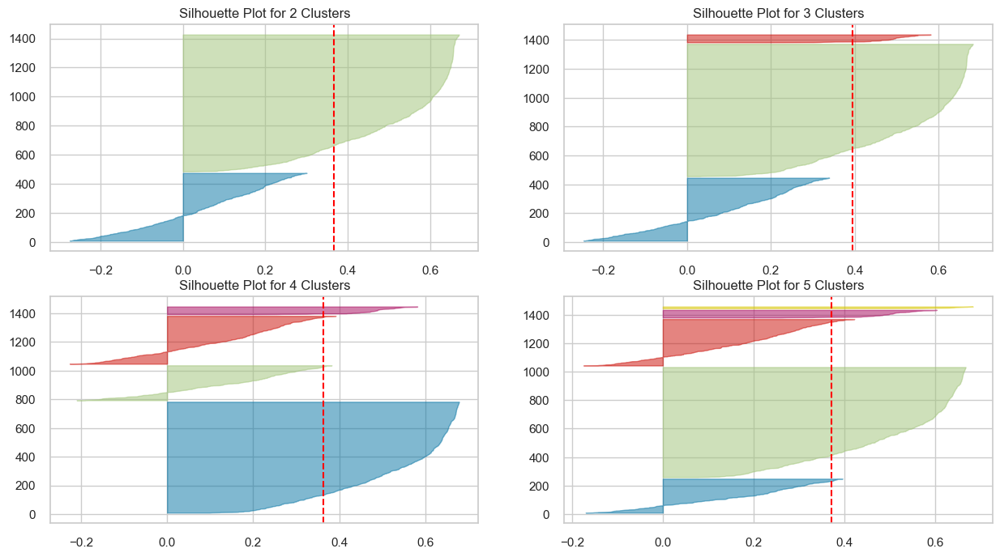

In [58]:
from yellowbrick.cluster import SilhouetteVisualizer
  
fig, ax = plt.subplots(2, 2, figsize=(15,8))
for i in [2, 3, 4, 5]:
    '''
    Create KMeans instances for different number of clusters
    '''
    km = KMeans(n_clusters=i, init='k-means++', n_init=10, max_iter=100, random_state=42)
    q, mod = divmod(i, 2)
    row_index = q - 1
    col_index = mod
    '''
    Create SilhouetteVisualizer instance with KMeans instance
    Fit the visualizer
    '''
    visualizer = SilhouetteVisualizer(km, colors='yellowbrick', ax=ax[q-1][mod])
    visualizer.fit(rb_scaled) 
    ax[row_index][col_index].set_title(f'Silhouette Plot for {i} Clusters')

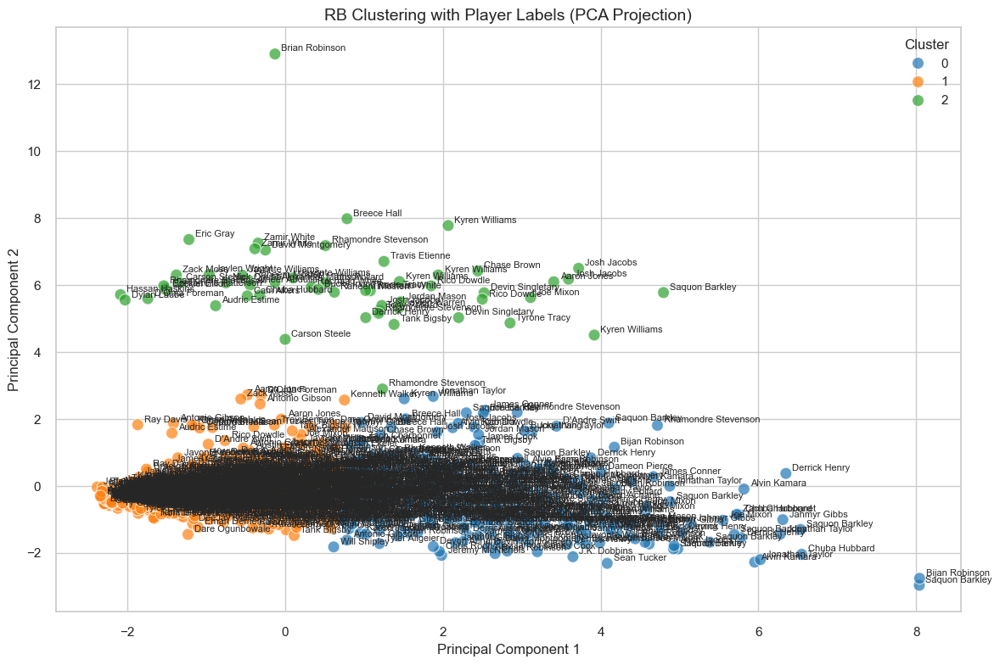

In [59]:
#RBs
#K-means
rb_kmeans = KMeans(n_clusters=3, random_state=42)
rb_df['cluster'] = rb_kmeans.fit_predict(rb_pca)
#Add PCA components back to DataFrame for plotting
rb_df['PCA1'] = rb_pca[:, 0]
rb_df['PCA2'] = rb_pca[:, 1]

#Cluster plot
plt.figure(figsize=(12, 8))
# Scatter plot with cluster coloring
sns.scatterplot(data=rb_df, x='PCA1', y='PCA2', hue='cluster', palette='tab10', s=100, alpha=0.7)
# Add player name annotations
for _, row in rb_df.iterrows():
    plt.text(
        row['PCA1'] + 0.08,  # small offset to prevent overlap
        row['PCA2'] + 0.08,
        row['player_display_name'],
        fontsize=8
    )

plt.title("RB Clustering with Player Labels (PCA Projection)", fontsize=14)
plt.xlabel("Principal Component 1")
plt.ylabel("Principal Component 2")
plt.legend(title="Cluster")
plt.grid(True)
plt.tight_layout()
plt.show()

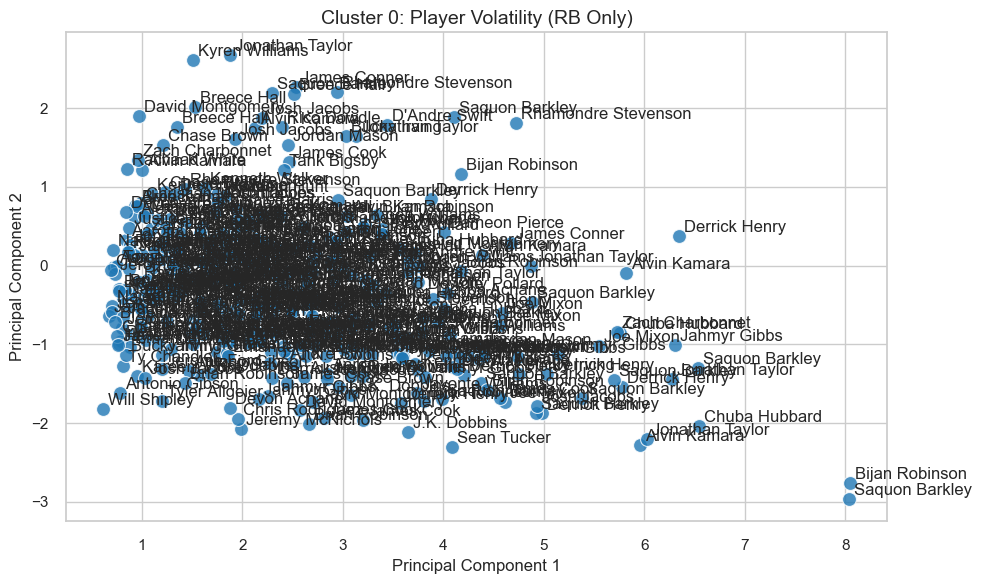

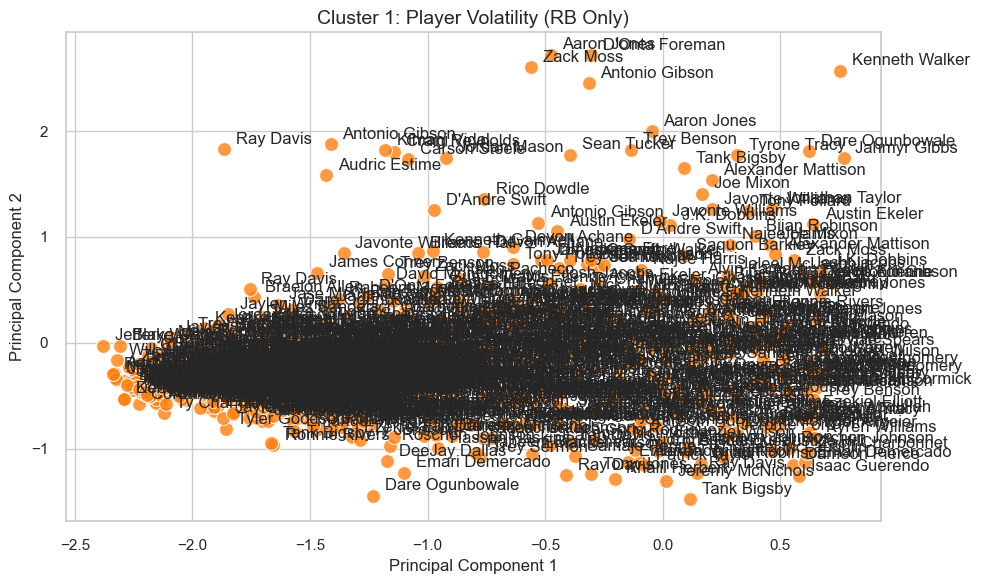

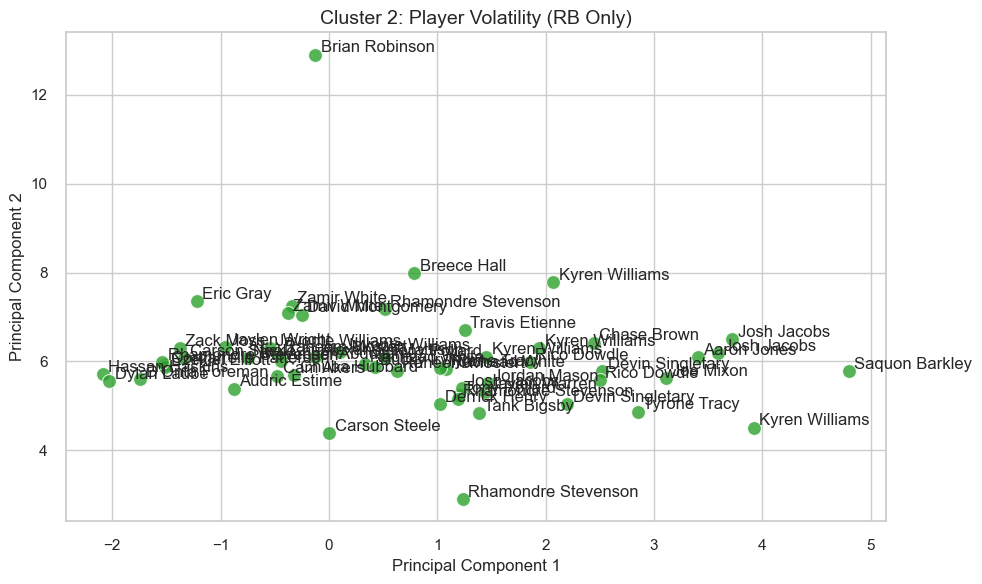

In [60]:
# Get unique clusters
unique_clusters = rb_df['cluster'].unique()
# Set plot style
sns.set(style="whitegrid")

# Create a subplot for each cluster
for cluster_label in sorted(unique_clusters):
    cluster_data = rb_df[rb_df['cluster'] == cluster_label]
    plt.figure(figsize=(10, 6))
    # Scatter plot
    sns.scatterplot(data=cluster_data,x='PCA1',y='PCA2',color=sns.color_palette('tab10')[cluster_label],s=100,alpha=0.8 )
    # Add player name annotations
    for _, row in cluster_data.iterrows():
        plt.text(
            row['PCA1'] + 0.05,
            row['PCA2'] + 0.05,
            row['player_display_name'],
            fontsize=12
        )
    
    plt.title(f"Cluster {cluster_label}: Player Volatility (RB Only)", fontsize=14)
    plt.xlabel("Principal Component 1")
    plt.ylabel("Principal Component 2")
    plt.grid(True)
    plt.tight_layout()
    plt.show()

In [61]:
rb_kmeans = KMeans(n_clusters=3, random_state=0, n_init=10)
rb_kmeans.fit(rb_scaled)

frame = pd.DataFrame(rb_scaled)
pred = rb_kmeans.predict(rb_scaled)
frame['cluster'] = pred
print(frame['cluster'].value_counts())


1    916
2    437
0     55
Name: cluster, dtype: int64


* Cluster 0 - least amount of data, put more the positive direction compared to cluster 1 - elite or outlier group
* Cluster 1 - has most of the data stored in it, more in the left negative region - average  RBs
* Cluster 2 - 2nd most of the data, - specialized RBs

In [62]:
rb_features_df = pd.DataFrame(rb_scaled, columns=rb_features)
rb_features_df['cluster'] = pred
cluster_summary = rb_features_df.groupby('cluster').mean()
cluster_summary


,carries,rushing_yards,rushing_tds,rushing_fumbles,rushing_fumbles_lost,rushing_first_downs,rushing_epa,rushing_2pt_conversions,receptions,target_share
cluster,,,,,,,,,,
0,0.470098,0.358844,0.009556,3.692366,4.915989,0.284179,-1.856367,0.083035,0.001145,-0.000963
1,-0.541106,-0.539395,-0.379839,-0.203873,-0.199837,-0.531513,-0.110531,-0.067206,-0.319879,-0.348766
2,1.075052,1.085468,0.794981,-0.037374,-0.199837,1.078344,0.465325,0.130420,0.670357,0.731172


* Cluster 0 - fumbles, fumbles lost - smallest group = low usage RB's / outlier group
* Cluster 1 - all negative values = backup / low-impact RB's
* Cluster 2 - carries, yards, first downs = Good RB's


In [63]:
rb_cluster_labels = {
    0: 'Turnover-Prone / Risky',
    1: 'Backup / Low-Usage',
    2: 'Workhorse / Starter'
}

rb_features_df['cluster_label'] = rb_features_df['cluster'].map(rb_cluster_labels)

In [64]:
# Make sure pca components are defined as 2 instead of 3
pca = PCA(n_components=2)
rb_pca = pca.fit_transform(rb_scaled)
pca_components = pca.components_


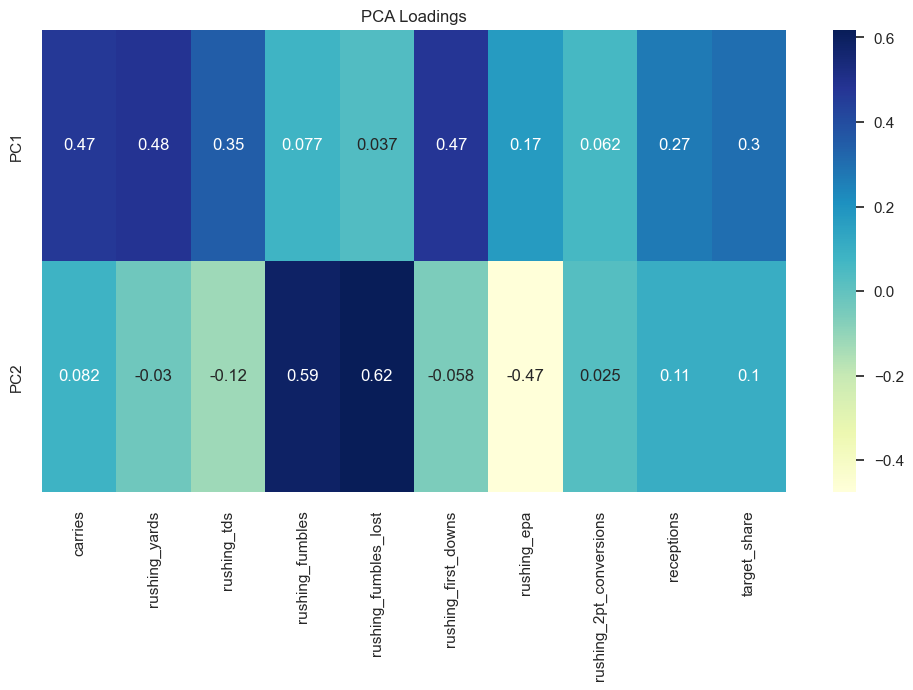

In [65]:
# DataFrame for PCA loadings
pca_loadings_df = pd.DataFrame(
    pca_components,
    columns=rb_features,  # use actual feature names
    index=[f'PC{i+1}' for i in range(pca.n_components)]
)
pca_loadings_df
# Heatmap of the loadings
plt.figure(figsize=(12, 6))
sns.heatmap(pca_loadings_df, cmap="YlGnBu", annot=True)
plt.title('PCA Loadings')
plt.show()
#PC1 - carries, rushes, first downs = GOOD STATS
#PC2 - funbles, fumble lost = BAD STATS



* Cluster 0 - closed to PC2 = confirms low usage RB's / outlier group
* Cluster 1 - close to PC1 in negative values, PC2 positive values = confirms low-impact RB's
* Cluster 2 - more spread out around the PC's = confirms Good RB's

In [66]:
pca.explained_variance_ 

array([3.5927028 , 2.01076075])

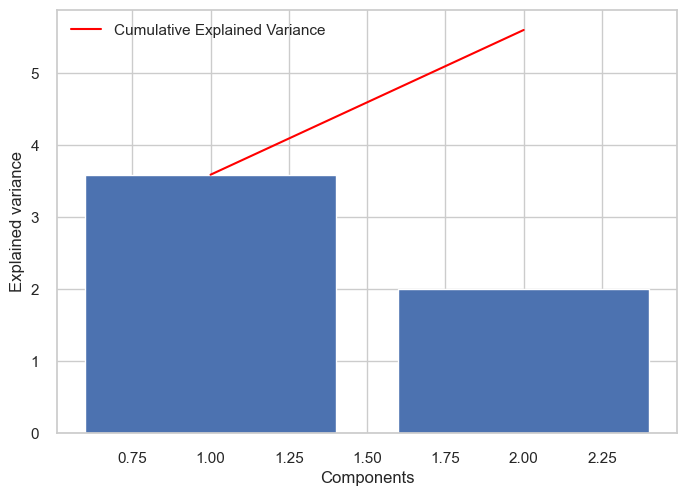

In [67]:
plt.bar(range(1,len(pca.explained_variance_ )+1),pca.explained_variance_ )
plt.ylabel('Explained variance')
plt.xlabel('Components')
plt.plot(range(1,len(pca.explained_variance_ )+1),
         np.cumsum(pca.explained_variance_),
         c='red',
         label="Cumulative Explained Variance")
plt.legend(loc='upper left')

Most of the variance is explained in PC1

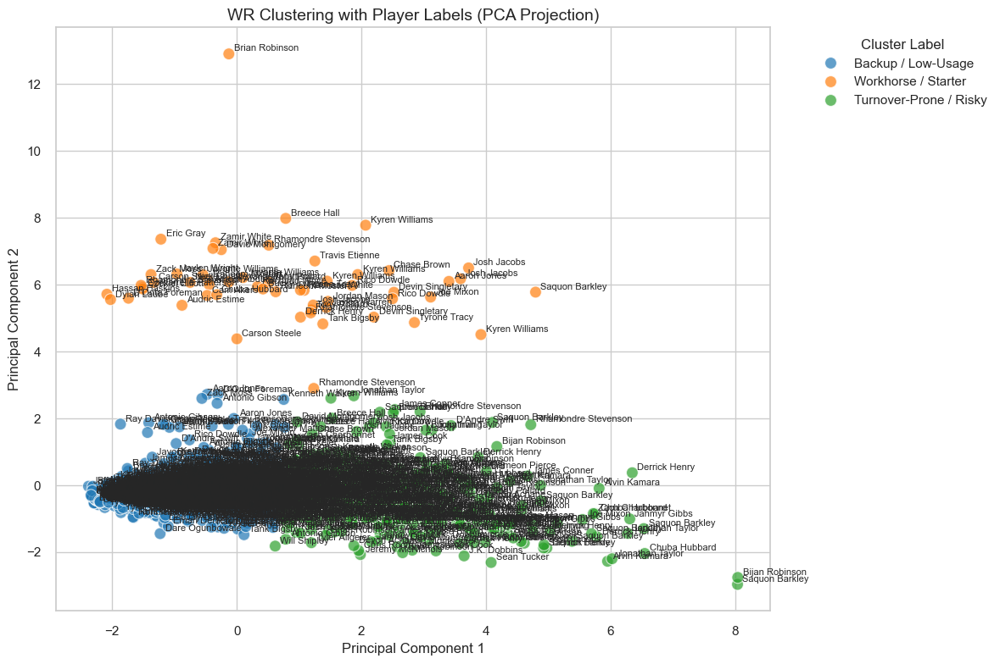

In [68]:
rb_df['cluster_label'] = rb_df['cluster'].map(rb_cluster_labels)

plt.figure(figsize=(12, 8))
sns.scatterplot(
    data=rb_df,
    x='PCA1',
    y='PCA2',
    hue='cluster_label',  # <--- use mapped labels
    palette='tab10',
    s=100,
    alpha=0.7
)

# Add player names
for _, row in rb_df.iterrows():
    plt.text(
        row['PCA1'] + 0.08,
        row['PCA2'] + 0.08,
        row['player_display_name'],
        fontsize=8
    )

plt.title("WR Clustering with Player Labels (PCA Projection)", fontsize=14)
plt.xlabel("Principal Component 1")
plt.ylabel("Principal Component 2")
plt.legend(title="Cluster Label", bbox_to_anchor=(1.05, 1), loc='upper left')
plt.grid(True)
plt.tight_layout()
plt.show()

In [69]:
# Final storage for weekly WR cluster results (ALL clusters)
rb_cluster_results = []
position = 'RB'
n_clusters = 3

# Loop through weeks and record ALL WRs
for week in sorted(df['week'].unique()):
    week_df = df[(df['week'] == week) & (df['position'] == position)].copy()

    if len(week_df) < n_clusters:
        continue

    X = week_df[rb_features].fillna(0)
    scaler = StandardScaler()
    X_scaled = scaler.fit_transform(X)

    pca = PCA(n_components=2)
    X_pca = pca.fit_transform(X_scaled)

    kmeans = KMeans(n_clusters=n_clusters, random_state=42)
    week_df['cluster'] = kmeans.fit_predict(X_pca)
    week_df['cluster_label'] = week_df['cluster'].map(rb_cluster_labels)

    # ✅ Store ALL WRs regardless of cluster label
    for _, row in week_df.iterrows():
        rb_cluster_results.append({
            'player_display_name': row['player_display_name'],
            'week': row['week'],
            'cluster': row['cluster']
        })

# Create cluster history DataFrame
rb_cluster_history = pd.DataFrame(rb_cluster_results)

# Sort by player and week
rb_cluster_history = rb_cluster_history.sort_values(by=['player_display_name', 'week'])

# Calculate week-to-week cluster change
rb_cluster_history['prev_cluster'] = rb_cluster_history.groupby('player_display_name')['cluster'].shift(1)
rb_cluster_history['cluster_changed'] = rb_cluster_history['cluster'] != rb_cluster_history['prev_cluster']
rb_cluster_history['cluster_changed'] = rb_cluster_history['cluster_changed'].fillna(False).astype(int)

# Compute volatility score (cluster change rate)
volatility_scores = rb_cluster_history.groupby('player_display_name')['cluster_changed'].agg(['sum', 'count'])
volatility_scores = volatility_scores[volatility_scores['count'] > 1]  # avoid div/0
volatility_scores['volatility_rate'] = volatility_scores['sum'] / (volatility_scores['count'] - 1)
print(volatility_scores)

# Sort and get top 5 most volatile WRs
volatility_scores_rb = volatility_scores.sort_values(by='volatility_rate', ascending=False)
most_volatile_rbs = volatility_scores.head(5).index.tolist()

# Extract their cluster history for plotting
volatile_data_rb = rb_cluster_history[rb_cluster_history['player_display_name'].isin(most_volatile_rbs)]

# Plot

fig = px.line(
    volatile_data_rb,
    x='week',
    y='cluster',
    color='player_display_name',
    markers=True,
    title="Most Volatile RBs",
    labels={'week': 'Week', 'cluster': 'Cluster', 'player_display_name': 'RB'},
    hover_name='player_display_name',
    hover_data={'week': True, 'cluster': True}
)

fig.update_layout(
    yaxis=dict(tickmode='linear'),
    legend_title_text='RB',
    template='plotly_white'
)

fig.show()

                     sum  count  volatility_rate
player_display_name                             
Aaron Jones           13     18         0.764706
Aaron Shampklin        1      3         0.500000
Alexander Mattison     8     14         0.615385
Alvin Kamara           8     14         0.615385
Ameer Abdullah         9     13         0.750000
...                  ...    ...              ...
Velus Jones            2      2         2.000000
Will Shipley           4      6         0.800000
Zach Charbonnet       13     17         0.812500
Zack Moss              8      8         1.142857
Zamir White            5      8         0.714286

[122 rows x 3 columns]


In [70]:
# Final storage for weekly WR cluster results (ALL clusters)
rb_cluster_results = []
position = 'RB'
n_clusters = 3

# Loop through weeks and record ALL WRs
for week in sorted(df['week'].unique()):
    week_df = df[(df['week'] == week) & (df['position'] == position)].copy()

    if len(week_df) < n_clusters:
        continue

    X = week_df[rb_features].fillna(0)
    scaler = StandardScaler()
    X_scaled = scaler.fit_transform(X)

    pca = PCA(n_components=2)
    X_pca = pca.fit_transform(X_scaled)

    kmeans = KMeans(n_clusters=n_clusters, random_state=42)
    week_df['cluster'] = kmeans.fit_predict(X_pca)
    week_df['cluster_label'] = week_df['cluster'].map(rb_cluster_labels)

    # ✅ Store ALL WRs regardless of cluster label
    for _, row in week_df.iterrows():
        rb_cluster_results.append({
            'player_display_name': row['player_display_name'],
            'week': row['week'],
            'cluster': row['cluster']
        })

# Create cluster history DataFrame
rb_cluster_history = pd.DataFrame(rb_cluster_results)

# Sort by player and week
rb_cluster_history = rb_cluster_history.sort_values(by=['player_display_name', 'week'])

# Calculate week-to-week cluster change
rb_cluster_history['prev_cluster'] = rb_cluster_history.groupby('player_display_name')['cluster'].shift(1)
rb_cluster_history['cluster_changed'] = rb_cluster_history['cluster'] != rb_cluster_history['prev_cluster']
rb_cluster_history['cluster_changed'] = rb_cluster_history['cluster_changed'].fillna(False).astype(int)

# Compute volatility score (cluster change rate)
volatility_scores = rb_cluster_history.groupby('player_display_name')['cluster_changed'].agg(['sum', 'count'])
volatility_scores = volatility_scores[volatility_scores['count'] > 1]  # avoid div/0
volatility_scores['volatility_rate'] = volatility_scores['sum'] / (volatility_scores['count'] - 1)
print(volatility_scores)

# ✅ Least volatile WRs
least_volatile_rbs = volatility_scores.tail(5).index.tolist()
least_volatile_data = rb_cluster_history[rb_cluster_history['player_display_name'].isin(least_volatile_rbs)]

fig = px.line(
    least_volatile_data,
    x='week',
    y='cluster',
    color='player_display_name',
    markers=True,
    title="Least Volatile RBs - Cluster Assignments Over Time",
    labels={'week': 'Week', 'cluster': 'Cluster', 'player_display_name': 'RB'},
    hover_name='player_display_name',
    hover_data={'week': True, 'cluster': True}
)

fig.update_layout(
    yaxis=dict(tickmode='linear'),
    legend_title_text='WR',
    template='plotly_white'
)

fig.show()

                     sum  count  volatility_rate
player_display_name                             
Aaron Jones           13     18         0.764706
Aaron Shampklin        1      3         0.500000
Alexander Mattison     8     14         0.615385
Alvin Kamara           8     14         0.615385
Ameer Abdullah         9     13         0.750000
...                  ...    ...              ...
Velus Jones            2      2         2.000000
Will Shipley           4      6         0.800000
Zach Charbonnet       13     17         0.812500
Zack Moss              8      8         1.142857
Zamir White            5      8         0.714286

[122 rows x 3 columns]


In [71]:
# Least volatile WRs
least_volatile_rbs = volatility_scores_rb.tail(5).index.tolist()
least_volatile_data = rb_cluster_history[rb_cluster_history['player_display_name'].isin(least_volatile_rbs)]

fig = px.line(
    least_volatile_data,
    x='week',
    y='cluster',
    color='player_display_name',
    markers=True,
    title="Least Volatile RBs - Cluster Assignments Over Time",
    labels={'week': 'Week', 'cluster': 'Cluster', 'player_display_name': 'RB'},
    hover_name='player_display_name',
    hover_data={'week': True, 'cluster': True}
)

fig.update_layout(
    yaxis=dict(tickmode='linear'),
    legend_title_text='RB',
    template='plotly_white'
)

fig.show()


_____
## DBSCAN
_____

#### QBS

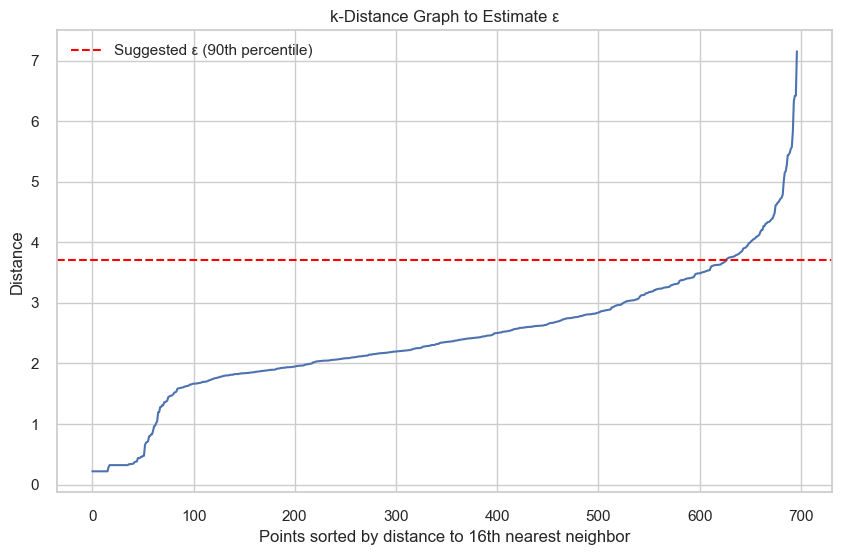

In [72]:
#Find eps
from sklearn.neighbors import NearestNeighbors

# Choose k = min_samples (start with 4 or 5)
min_samples = 16
neighbors = NearestNeighbors(n_neighbors=min_samples)
neighbors_fit = neighbors.fit(qb_scaled)
distances, indices = neighbors_fit.kneighbors(qb_scaled)

# Sort and plot the distances (distance to k-th nearest neighbor)
k_distances = np.sort(distances[:, -1])  # last column = distance to k-th neighbor
plt.figure(figsize=(10, 6))
plt.plot(k_distances)
plt.axhline(y=np.percentile(k_distances, 90), color='red', linestyle='--', label='Suggested ε (90th percentile)')
plt.xlabel("Points sorted by distance to {}th nearest neighbor".format(min_samples))
plt.ylabel("Distance")
plt.title("k-Distance Graph to Estimate ε")
plt.legend()
plt.grid(True)
plt.show()

#Find minpts



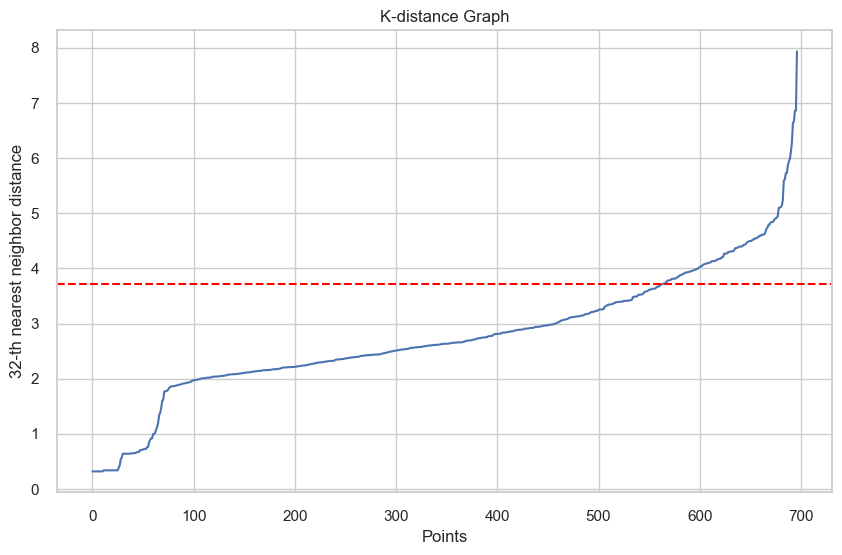

In [73]:
from sklearn.neighbors import NearestNeighbors
# Function to plot k-distance graph
def plot_k_distance_graph(X, k):
    neigh = NearestNeighbors(n_neighbors=k)
    neigh.fit(X)
    distances, _ = neigh.kneighbors(X)
    distances = np.sort(distances[:, k-1])
    plt.figure(figsize=(10, 6))
    plt.plot(distances)
    plt.axhline(y=np.percentile(k_distances, 90), color='red', linestyle='--', label='Suggested ε (90th percentile)')
    plt.xlabel('Points')
    plt.ylabel(f'{k}-th nearest neighbor distance')
    plt.title('K-distance Graph')
    plt.show()
# Plot k-distance graph
plot_k_distance_graph(qb_scaled, k=32)
#k = 16, ep = 3.75 ~ 4
#k = 32, ep = 3.74 ~ 4

Rule to thumb for minpts = 2 * num of features

In [74]:
print(len(qb_features))
# 2 * 16 = 32, too much

#Citation: https://www.datacamp.com/tutorial/dbscan-clustering-algorithm

16


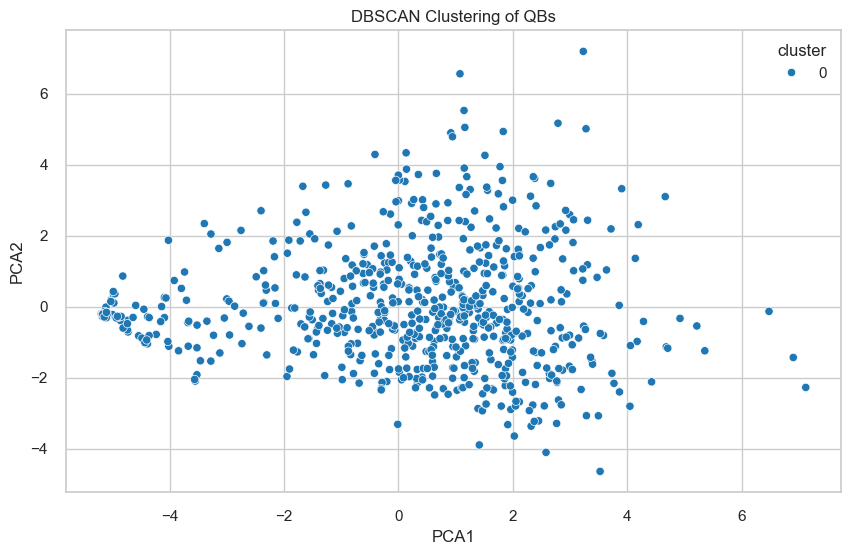

In [75]:
from sklearn.cluster import DBSCAN

pca = PCA(n_components=2)
qb_pca = pca.fit_transform(qb_scaled)

# Run DBSCAN on PCA-reduced data
dbscan = DBSCAN(eps=4, min_samples=32)
dbscan_labels_qb = dbscan.fit_predict(qb_pca)

# Add clustering results to a dataframe
dbscan_qb = pd.DataFrame(qb_pca, columns=['PCA1', 'PCA2'])
dbscan_qb['cluster'] = dbscan_labels_qb

# Plot the clusters
plt.figure(figsize=(10, 6))
sns.scatterplot(data=dbscan_qb, x='PCA1', y='PCA2', hue='cluster', palette='tab10')
plt.title("DBSCAN Clustering of QBs")
plt.grid(True)
plt.show()



Similar to K-Means plot

In [76]:
print(dbscan_qb['cluster'].value_counts())
print("Total data points:", len(dbscan_qb))
#All the points are clustered as 1

0    697
Name: cluster, dtype: int64
Total data points: 697


In [77]:
pca = PCA(n_components=2)
qb_pca = pca.fit_transform(qb_scaled)
pca_components_qb = pca.components_

# DataFrame for PCA loadings
pca_loadings_qb = pd.DataFrame(
    pca_components_qb,
    columns=qb_features,  # use actual feature names
    index=[f'PC{i+1}' for i in range(pca.n_components)]
)
pca_loadings_qb

,completions,attempts,passing_yards,passing_tds,interceptions,sacks,sack_yards,sack_fumbles,sack_fumbles_lost,passing_air_yards,passing_yards_after_catch,passing_first_downs,passing_epa,passing_2pt_conversions,pacr,carries
PC1,0.378909,0.369809,0.382772,0.253496,0.130207,0.183542,0.171337,0.104503,0.078614,0.315399,0.343761,0.376786,0.112589,0.051316,0.158079,0.108997
PC2,-0.013704,0.057686,-0.096055,-0.236250,0.199880,0.416808,0.422977,0.335976,0.325082,0.091649,-0.143004,-0.109257,-0.486856,-0.020295,-0.194305,-0.065683


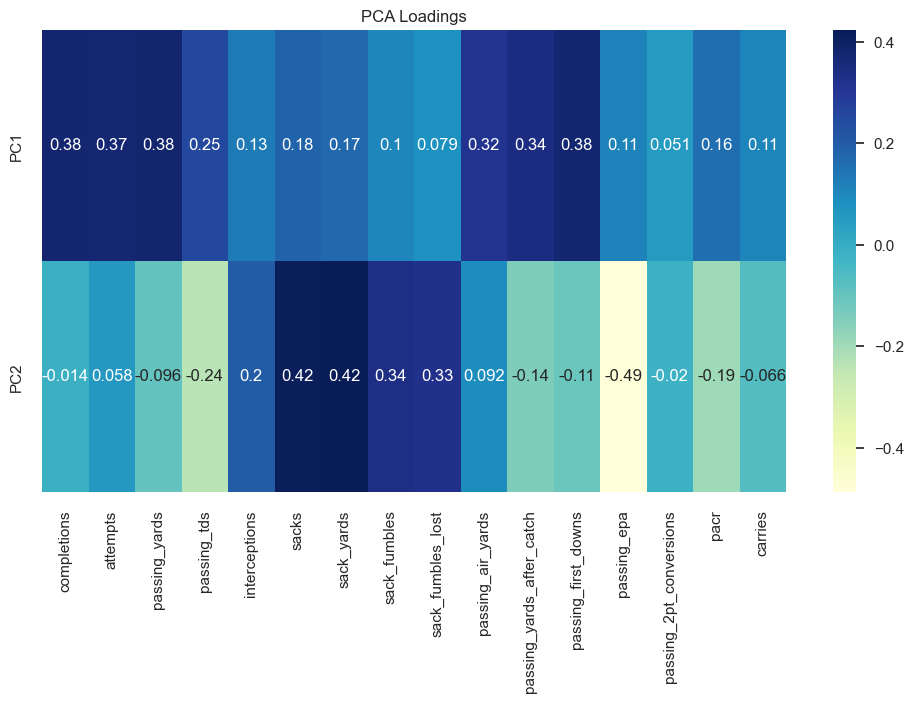

In [78]:
# Heatmap of the loadings
plt.figure(figsize=(12, 6))
sns.heatmap(pca_loadings_qb, cmap="YlGnBu", annot=True)
plt.title('PCA Loadings')
plt.show()
#PC1 - completions, attempts, passing yards, passing air yards, passing yards after catch, passing first downs = GOOD STATS
#PC2 - sacks, sack_yards, sack fumbles, sack fumbles lost = SACKS STATS

In [79]:
pca.explained_variance_

pca = PCA(n_components=2)
qb_pca = pca.fit_transform(qb_scaled)

# Raw variance (eigenvalues)
print("Explained variance (raw):", pca.explained_variance_)

# Proportion of variance explained (recommended)
print("Explained variance ratio (%):", pca.explained_variance_ratio_)
print("Total variance explained:", pca.explained_variance_ratio_.sum())


Explained variance (raw): [6.31564984 2.76580983]
Explained variance ratio (%): [0.39416179 0.1726151 ]
Total variance explained: 0.5667768943587101


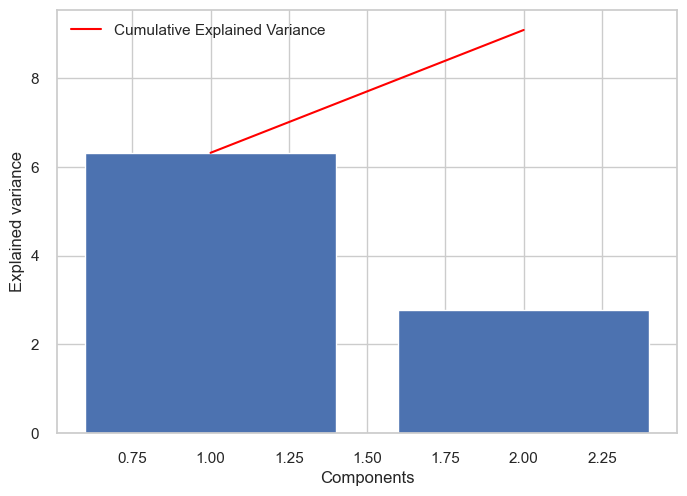

In [80]:
plt.bar(range(1,len(pca.explained_variance_ )+1),pca.explained_variance_ )
plt.ylabel('Explained variance')
plt.xlabel('Components')
plt.plot(range(1,len(pca.explained_variance_ )+1),
         np.cumsum(pca.explained_variance_),
         c='red',
         label="Cumulative Explained Variance")
plt.legend(loc='upper left')

Same as K-Means run, irrelevant

In [81]:
qb_cluster_results = []

for week in sorted(df['week'].unique()):
    week_df = df[(df['week'] == week) & (df['position'] == 'QB')].copy()

    # Fit PCA + DBSCAN
    X = week_df[qb_features].fillna(0)
    X_scaled = StandardScaler().fit_transform(X)
    qb_pca = PCA(n_components=2).fit_transform(X_scaled)

    db = DBSCAN(eps=3.75, min_samples=32)
    week_df['dbscan_cluster'] = db.fit_predict(qb_pca)

    for _, row in week_df.iterrows():
        qb_cluster_results.append({
            'player_display_name': row['player_display_name'],
            'week': row['week'],
            'cluster': row['dbscan_cluster']
        })

qb_cluster_history = pd.DataFrame(qb_cluster_results)

# Sort by player and week
qb_cluster_history = qb_cluster_history.sort_values(by=['player_display_name', 'week'])

# Calculate week-to-week changes in DBSCAN cluster
qb_cluster_history['prev_cluster'] = qb_cluster_history.groupby('player_display_name')['cluster'].shift(1)
qb_cluster_history['cluster_changed'] = qb_cluster_history['cluster'] != qb_cluster_history['prev_cluster']
qb_cluster_history['cluster_changed'] = qb_cluster_history['cluster_changed'].fillna(False).astype(int)

# Volatility score = number of cluster changes / (weeks - 1)
volatility_scores = qb_cluster_history.groupby('player_display_name')['cluster_changed'].agg(['sum', 'count'])
volatility_scores = volatility_scores[volatility_scores['count'] > 1]  # avoid division by 0
volatility_scores['volatility_rate'] = volatility_scores['sum'] / (volatility_scores['count'] - 1)
volatility_scores = volatility_scores.sort_values(by='volatility_rate', ascending=False)

# Top 5 most volatile QBs
most_volatile_qbs = volatility_scores.head(5).index.tolist()
volatile_data = qb_cluster_history[qb_cluster_history['player_display_name'].isin(most_volatile_qbs)]

fig = px.line(
    volatile_data,
    x='week',
    y='cluster',  # still called 'cluster' in history
    color='player_display_name',
    markers=True,
    title="Most Volatile QBs (DBSCAN)",
    labels={'week': 'Week', 'cluster': 'DBSCAN Cluster', 'player_display_name': 'QB'},
    hover_name='player_display_name',
    hover_data={'week': True, 'cluster': True}
)

fig.update_layout(
    yaxis=dict(tickmode='linear'),
    legend_title_text='QB',
    template='plotly_white'
)

fig.show()



In [82]:
# Least volatile QBs (lowest cluster change rate)
least_volatile_qbs = volatility_scores.sort_values(by='volatility_rate', ascending=True).head(5).index.tolist()

# Filter data for least volatile QBs
least_volatile_data = qb_cluster_history[qb_cluster_history['player_display_name'].isin(least_volatile_qbs)]

# Interactive line plot
fig = px.line(
    least_volatile_data,
    x='week',
    y='cluster',
    color='player_display_name',
    markers=True,
    title="Least Volatile QBs - Cluster Assignments Over Time",
    labels={'week': 'Week', 'cluster': 'Cluster', 'player_display_name': 'QB'},
    hover_name='player_display_name',
    hover_data={'week': True, 'cluster': True}
)

fig.update_layout(
    yaxis=dict(tickmode='linear'),
    legend_title_text='QB',
    template='plotly_white'
)

fig.show()

____
#### WR
____

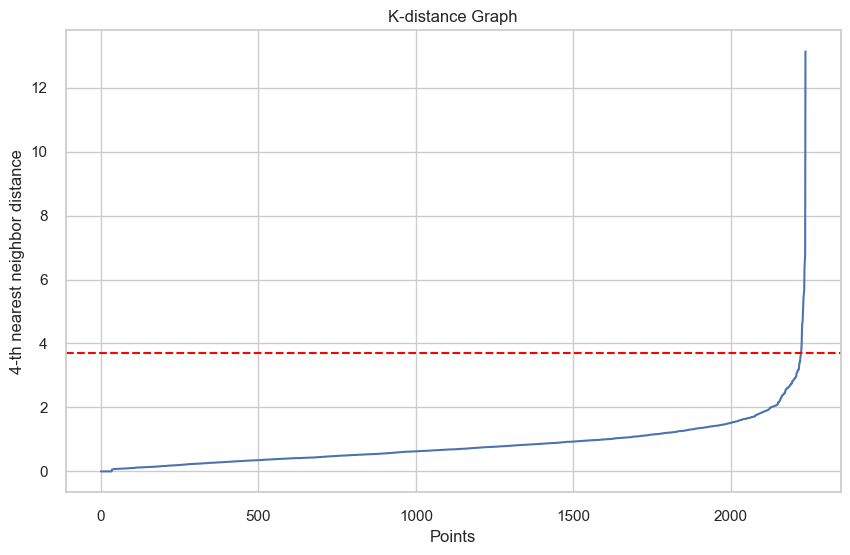

In [83]:
from sklearn.neighbors import NearestNeighbors
# Function to plot k-distance graph
def plot_k_distance_graph(X, k):
    neigh = NearestNeighbors(n_neighbors=k)
    neigh.fit(X)
    distances, _ = neigh.kneighbors(X)
    distances = np.sort(distances[:, k-1])
    plt.figure(figsize=(10, 6))
    plt.plot(distances)
    plt.axhline(y=np.percentile(k_distances, 90), color='red', linestyle='--', label='Suggested ε (90th percentile)')
    plt.xlabel('Points')
    plt.ylabel(f'{k}-th nearest neighbor distance')
    plt.title('K-distance Graph')
    plt.show()
# Plot k-distance graph
plot_k_distance_graph(wr_scaled, k=4)
#k = 16, ep = 3.75 ~ 4
#k = 32, ep = 3.74 ~ 4

In [84]:
print(len(wr_features))
#12
#2 * 12 = 24

12


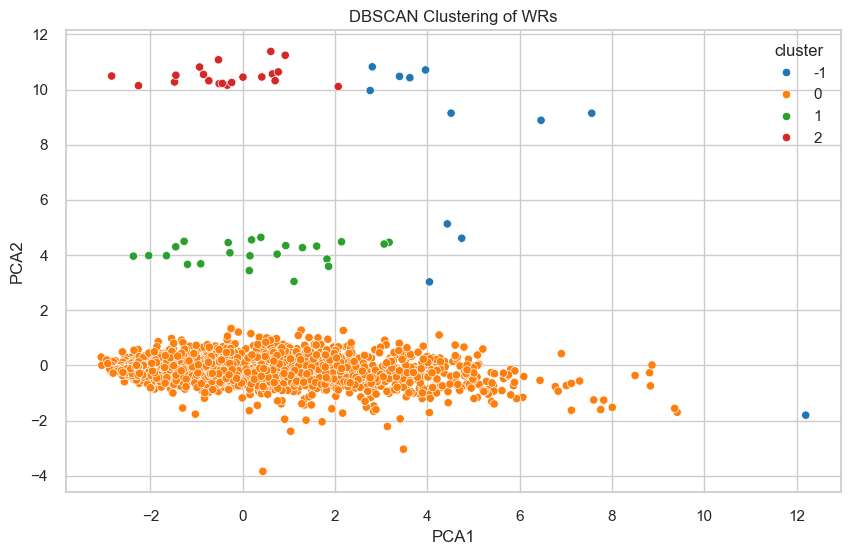

In [85]:
pca = PCA(n_components=2)
wr_pca = pca.fit_transform(wr_scaled)

# Run DBSCAN on PCA-reduced data
dbscan = DBSCAN(eps=1.75, min_samples=12)
dbscan_labels_wr = dbscan.fit_predict(wr_pca)

# Add clustering results to a dataframe
dbscan_wr = pd.DataFrame(wr_pca, columns=['PCA1', 'PCA2'])
dbscan_wr['cluster'] = dbscan_labels_wr

# Plot the clusters
plt.figure(figsize=(10, 6))
sns.scatterplot(data=dbscan_wr, x='PCA1', y='PCA2', hue='cluster', palette='tab10')
plt.title("DBSCAN Clustering of WRs")
plt.grid(True)
plt.show()

In [86]:
print(dbscan_wr['cluster'].value_counts())  # Includes -1 for noise, if any
#Cluster 0 - most data, almost all
#Cluster 1 - not alot 
#Cluster 2 - just 3 less than Cluster 2
#Cluster -1 - 12 data points = noise

 0    2183
 1      23
 2      20
-1      12
Name: cluster, dtype: int64


In [87]:
wr_cluster_results = []

for week in sorted(df['week'].unique()):
    week_df = df[(df['week'] == week) & (df['position'] == 'WR')].copy()

    # Fit PCA + DBSCAN
    X = week_df[wr_features].fillna(0)
    X_scaled = StandardScaler().fit_transform(X)
    wr_pca = PCA(n_components=2).fit_transform(X_scaled)

    db = DBSCAN(eps=1.75, min_samples=12)
    week_df['dbscan_cluster'] = db.fit_predict(wr_pca)

    for _, row in week_df.iterrows():
        wr_cluster_results.append({
            'player_display_name': row['player_display_name'],
            'week': row['week'],
            'cluster': row['dbscan_cluster']
        })

wr_cluster_history = pd.DataFrame(wr_cluster_results)

# Sort by player and week
wr_cluster_history = wr_cluster_history.sort_values(by=['player_display_name', 'week'])

# Calculate week-to-week changes in DBSCAN cluster
wr_cluster_history['prev_cluster'] = wr_cluster_history.groupby('player_display_name')['cluster'].shift(1)
wr_cluster_history['cluster_changed'] = wr_cluster_history['cluster'] != wr_cluster_history['prev_cluster']
wr_cluster_history['cluster_changed'] = wr_cluster_history['cluster_changed'].fillna(False).astype(int)

# Volatility score = number of cluster changes / (weeks - 1)
volatility_scores = wr_cluster_history.groupby('player_display_name')['cluster_changed'].agg(['sum', 'count'])
volatility_scores = volatility_scores[volatility_scores['count'] > 1]  # avoid division by 0
volatility_scores['volatility_rate'] = volatility_scores['sum'] / (volatility_scores['count'] - 1)
volatility_scores = volatility_scores.sort_values(by='volatility_rate', ascending=False)

# Top 5 most volatile QBs
most_volatile_wrs = volatility_scores.head(5).index.tolist()
volatile_data = wr_cluster_history[wr_cluster_history['player_display_name'].isin(most_volatile_wrs)]

fig = px.line(
    volatile_data,
    x='week',
    y='cluster',  # still called 'cluster' in history
    color='player_display_name',
    markers=True,
    title="Most Volatile WRs (DBSCAN)",
    labels={'week': 'Week', 'cluster': 'DBSCAN Cluster', 'player_display_name': 'WR'},
    hover_name='player_display_name',
    hover_data={'week': True, 'cluster': True}
)

fig.update_layout(
    yaxis=dict(tickmode='linear'),
    legend_title_text='WR',
    template='plotly_white'
)

fig.show()

In [88]:
least_volatile_wrs = volatility_scores.sort_values(by='volatility_rate', ascending=True).head(5).index.tolist()

# Filter data for least volatile QBs
least_volatile_data = wr_cluster_history[wr_cluster_history['player_display_name'].isin(least_volatile_wrs)]

# Interactive line plot
fig = px.line(
    least_volatile_data,
    x='week',
    y='cluster',
    color='player_display_name',
    markers=True,
    title="Least Volatile WRs (DBSCAN)",
    labels={'week': 'Week', 'cluster': 'Cluster', 'player_display_name': 'WR'},
    hover_name='player_display_name',
    hover_data={'week': True, 'cluster': True}
)

fig.update_layout(
    yaxis=dict(tickmode='linear'),
    legend_title_text='WR',
    template='plotly_white'
)

fig.show()

_____
#### RBs
_____

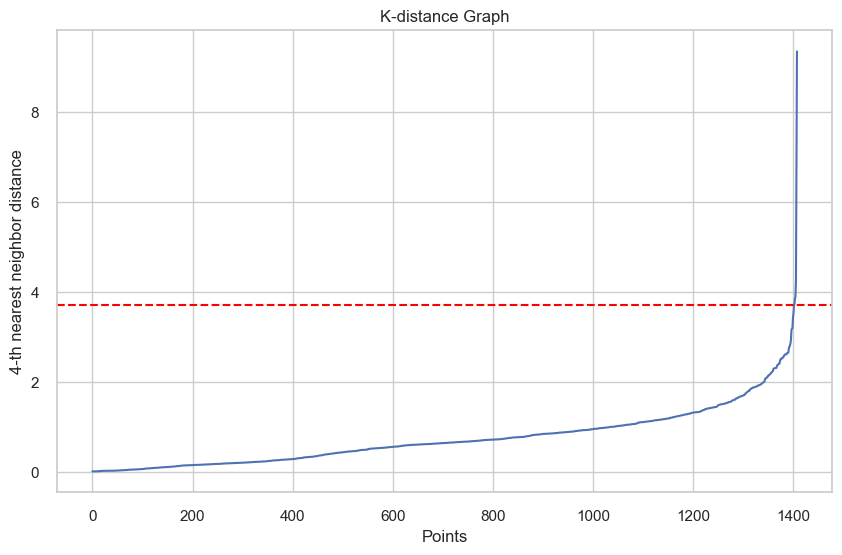

In [89]:
# Function to plot k-distance graph
def plot_k_distance_graph(X, k):
    neigh = NearestNeighbors(n_neighbors=k)
    neigh.fit(X)
    distances, _ = neigh.kneighbors(X)
    distances = np.sort(distances[:, k-1])
    plt.figure(figsize=(10, 6))
    plt.plot(distances)
    plt.axhline(y=np.percentile(k_distances, 90), color='red', linestyle='--', label='Suggested ε (90th percentile)')
    plt.xlabel('Points')
    plt.ylabel(f'{k}-th nearest neighbor distance')
    plt.title('K-distance Graph')
    plt.show()
# Plot k-distance graph
plot_k_distance_graph(rb_scaled, k=4)
#1.75

In [90]:
print(len(rb_features))
#10 * 2 = 20

10


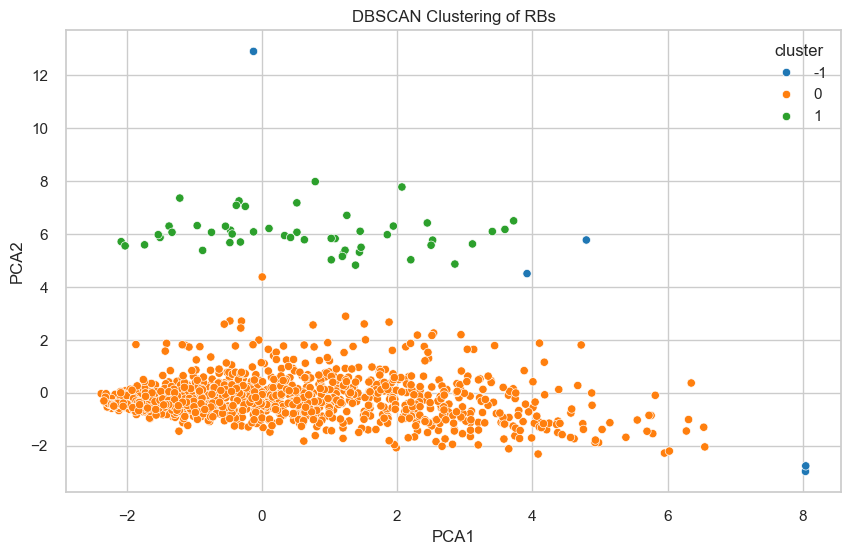

In [91]:
pca = PCA(n_components=2)
rb_pca = pca.fit_transform(rb_scaled)

# Run DBSCAN on PCA-reduced data
dbscan = DBSCAN(eps=1.75, min_samples=20)
dbscan_labels_rb = dbscan.fit_predict(rb_pca)

# Add clustering results to a dataframe
dbscan_rb = pd.DataFrame(rb_pca, columns=['PCA1', 'PCA2'])
dbscan_rb['cluster'] = dbscan_labels_rb

# Plot the clusters
plt.figure(figsize=(10, 6))
sns.scatterplot(data=dbscan_rb, x='PCA1', y='PCA2', hue='cluster', palette='tab10')
plt.title("DBSCAN Clustering of RBs")
plt.grid(True)
plt.show()

In [92]:
print(dbscan_rb['cluster'].value_counts()) 
#Majority of the data is in Cluster 0
#Small amount of data is in Cluster 1
#Cluster -1 = Noise

 0    1352
 1      51
-1       5
Name: cluster, dtype: int64


In [93]:
rb_cluster_results = []

for week in sorted(df['week'].unique()):
    week_df = df[(df['week'] == week) & (df['position'] == 'RB')].copy()

    # Fit PCA + DBSCAN
    X = week_df[rb_features].fillna(0)
    X_scaled = StandardScaler().fit_transform(X)
    rb_pca = PCA(n_components=2).fit_transform(X_scaled)

    db = DBSCAN(eps=1.75, min_samples=20)
    week_df['dbscan_cluster'] = db.fit_predict(rb_pca)

    for _, row in week_df.iterrows():
        rb_cluster_results.append({
            'player_display_name': row['player_display_name'],
            'week': row['week'],
            'cluster': row['dbscan_cluster']
        })

rb_cluster_history = pd.DataFrame(rb_cluster_results)

# Sort by player and week
rb_cluster_history = rb_cluster_history.sort_values(by=['player_display_name', 'week'])

# Calculate week-to-week changes in DBSCAN cluster
rb_cluster_history['prev_cluster'] = rb_cluster_history.groupby('player_display_name')['cluster'].shift(1)
rb_cluster_history['cluster_changed'] = rb_cluster_history['cluster'] != rb_cluster_history['prev_cluster']
rb_cluster_history['cluster_changed'] = rb_cluster_history['cluster_changed'].fillna(False).astype(int)

# Volatility score = number of cluster changes / (weeks - 1)
volatility_scores = rb_cluster_history.groupby('player_display_name')['cluster_changed'].agg(['sum', 'count'])
volatility_scores = volatility_scores[volatility_scores['count'] > 1]  # avoid division by 0
volatility_scores['volatility_rate'] = volatility_scores['sum'] / (volatility_scores['count'] - 1)
volatility_scores = volatility_scores.sort_values(by='volatility_rate', ascending=False)

# Top 5 most volatile QBs
most_volatile_rbs_db = volatility_scores.head(5).index.tolist()
volatile_data = rb_cluster_history[rb_cluster_history['player_display_name'].isin(most_volatile_rbs_db)]

fig = px.line(
    volatile_data,
    x='week',
    y='cluster',  # still called 'cluster' in history
    color='player_display_name',
    markers=True,
    title="Most Volatile RBs (DBSCAN)",
    labels={'week': 'Week', 'cluster': 'DBSCAN Cluster', 'player_display_name': 'RB'},
    hover_name='player_display_name',
    hover_data={'week': True, 'cluster': True}
)

fig.update_layout(
    yaxis=dict(tickmode='linear'),
    legend_title_text='RB',
    template='plotly_white'
)

fig.show()

In [94]:
least_volatile_rbs = volatility_scores.sort_values(by='volatility_rate', ascending=True).head(5).index.tolist()

# Filter data for least volatile QBs
least_volatile_data = rb_cluster_history[rb_cluster_history['player_display_name'].isin(least_volatile_rbs)]

# Interactive line plot
fig = px.line(
    least_volatile_data,
    x='week',
    y='cluster',
    color='player_display_name',
    markers=True,
    title="Least Volatile RBs (DBSCAN)",
    labels={'week': 'Week', 'cluster': 'Cluster', 'player_display_name': 'RB'},
    hover_name='player_display_name',
    hover_data={'week': True, 'cluster': True}
)

fig.update_layout(
    yaxis=dict(tickmode='linear'),
    legend_title_text='RB',
    template='plotly_white'
)

fig.show()

Comparing volatility between kmeans and dbscan

In [95]:
set_kmeans = set(most_volatile_rbs)
set_dbscan = set(most_volatile_rbs_db)
print("Overlap:", set_kmeans.intersection(set_dbscan))

# Nothing printed = top 5 most volatile RBs from KMeans and DBSCAN do not match — which is okay/expected.

Overlap: set()


____
##### Clustering w/o PCA
_____

<Axes: xlabel='PCA1', ylabel='PCA2'>

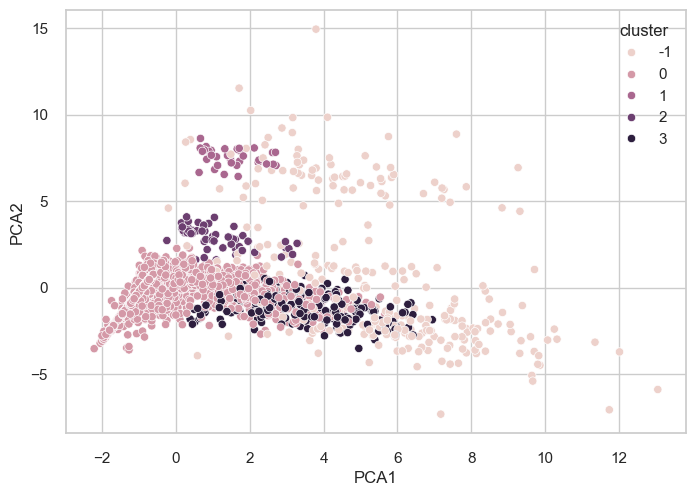

In [96]:
# 1. Select and scale features
X = df[rb_features].fillna(0)
X_scaled = StandardScaler().fit_transform(X)

# 2. Run DBSCAN on the scaled data directly
dbscan = DBSCAN(eps=1.75, min_samples=20)
labels = dbscan.fit_predict(X_scaled)

# 3. Assign cluster labels back to your dataframe
df['cluster'] = labels

#Only visualizing with PCA
pca = PCA(n_components=2)
pca_result = pca.fit_transform(X_scaled)

df['PCA1'] = pca_result[:, 0]
df['PCA2'] = pca_result[:, 1]

sns.scatterplot(data=df, x='PCA1', y='PCA2', hue='cluster')


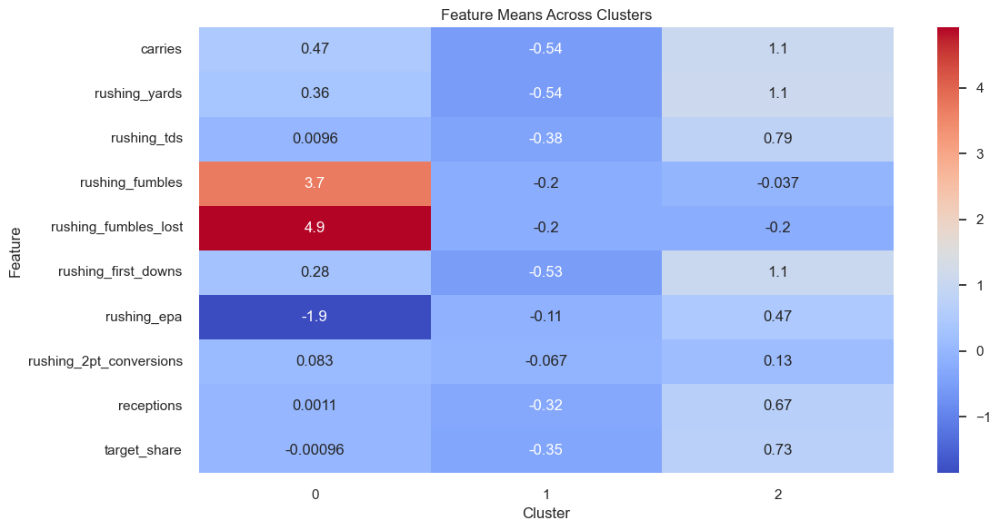

In [97]:
plt.figure(figsize=(12, 6))
sns.heatmap(cluster_summary.T, cmap="coolwarm", annot=True)
plt.title("Feature Means Across Clusters")
plt.xlabel("Cluster")
plt.ylabel("Feature")
plt.tight_layout()
plt.show()


In [98]:
# After clustering (e.g., DBSCAN or KMeans), assign labels
df['cluster'] = labels

# Group by cluster and take the mean of each feature
cluster_summary = df.groupby('cluster')[rb_features].mean()

# Show which features differ most across clusters
display(cluster_summary)


,carries,rushing_yards,rushing_tds,rushing_fumbles,rushing_fumbles_lost,rushing_first_downs,rushing_epa,rushing_2pt_conversions,receptions,target_share
cluster,,,,,,,,,,
-1,15.204778,77.624573,0.96587,0.47099,0.238908,4.286689,0.362813,0.061433,1.887372,0.118608
0,1.628081,6.612323,0.00000,0.00000,0.000000,0.358788,-0.124994,0.000000,2.250303,0.129662
1,3.794118,10.529412,0.00000,1.00000,1.000000,0.588235,-5.601665,0.000000,0.558824,0.090100
2,4.034483,14.344828,0.00000,1.00000,0.000000,0.982759,-0.759444,0.000000,0.224138,0.085669
3,9.793893,46.110687,1.00000,0.00000,0.000000,2.919847,1.415700,0.000000,1.572519,0.102182


* Cluster -1 (Noise): Elite RB's -> high volume, high efficiency for rushing yards and carries
* Cluster 0: Good Receivers ->  low rushing but high receiving stats
* Cluster 1: "Bad" RBs -> low volume, negative EPA, fumbles
* Cluster 2: Low Usage RBs -> light workload with poor efficiency
* Cluster 3: Productive RBs -> good rushing and EPA stats w/ moderate receiving

In [99]:
rb_cluster_results = []

# Loop over each week and apply DBSCAN on full features (no PCA)
for week in sorted(df['week'].unique()):
    week_df = df[(df['week'] == week) & (df['position'] == 'RB')].copy()

    if len(week_df) < 20:  # safety check for DBSCAN min_samples
        continue

    # Scale RB features
    X = week_df[rb_features].fillna(0)
    X_scaled = StandardScaler().fit_transform(X)

    # Run DBSCAN without PCA
    db = DBSCAN(eps=1.75, min_samples=20)
    week_df['dbscan_cluster'] = db.fit_predict(X_scaled)

    for _, row in week_df.iterrows():
        rb_cluster_results.append({
            'player_display_name': row['player_display_name'],
            'week': row['week'],
            'cluster': row['dbscan_cluster']
        })

# Store results
rb_cluster_history = pd.DataFrame(rb_cluster_results)

# Sort by player and week
rb_cluster_history = rb_cluster_history.sort_values(by=['player_display_name', 'week'])

# Calculate week-to-week cluster change
rb_cluster_history['prev_cluster'] = rb_cluster_history.groupby('player_display_name')['cluster'].shift(1)
rb_cluster_history['cluster_changed'] = rb_cluster_history['cluster'] != rb_cluster_history['prev_cluster']
rb_cluster_history['cluster_changed'] = rb_cluster_history['cluster_changed'].fillna(False).astype(int)

# Calculate volatility = # of cluster changes / (weeks - 1)
volatility_scores = rb_cluster_history.groupby('player_display_name')['cluster_changed'].agg(['sum', 'count'])
volatility_scores = volatility_scores[volatility_scores['count'] > 1]  # avoid division by 0
volatility_scores['volatility_rate'] = volatility_scores['sum'] / (volatility_scores['count'] - 1)
volatility_scores = volatility_scores.sort_values(by='volatility_rate', ascending=False)

# Top 5 most volatile RBs
most_volatile_rbs = volatility_scores.head(5).index.tolist()
volatile_data = rb_cluster_history[rb_cluster_history['player_display_name'].isin(most_volatile_rbs)]

# Plot volatility over time
fig = px.line(
    volatile_data,
    x='week',
    y='cluster',
    color='player_display_name',
    markers=True,
    title="Most Volatile RBs (DBSCAN Without PCA)",
    labels={'week': 'Week', 'cluster': 'DBSCAN Cluster', 'player_display_name': 'RB'},
    hover_name='player_display_name',
    hover_data={'week': True, 'cluster': True}
)

fig.update_layout(
    yaxis=dict(tickmode='linear'),
    legend_title_text='RB',
    template='plotly_white'
)

fig.show()


In [100]:
least_volatile_rbs = volatility_scores.sort_values(by='volatility_rate', ascending=True).head(5).index.tolist()

# Filter data for least volatile QBs
least_volatile_data = rb_cluster_history[rb_cluster_history['player_display_name'].isin(least_volatile_rbs)]

# Interactive line plot
fig = px.line(
    least_volatile_data,
    x='week',
    y='cluster',
    color='player_display_name',
    markers=True,
    title="Least Volatile RBs (DBSCAN Without PCA)",
    labels={'week': 'Week', 'cluster': 'Cluster', 'player_display_name': 'RB'},
    hover_name='player_display_name',
    hover_data={'week': True, 'cluster': True}
)

fig.update_layout(
    yaxis=dict(tickmode='linear'),
    legend_title_text='RB',
    template='plotly_white'
)

fig.show()